In [1]:
# Parameters (overriden by papermill)
DATASET = 'short-linkers'

In [2]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
import os
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from tqdm import tqdm
sns.set_palette('Dark2')
sns.set_context('paper')
sns.set_style({'axes.axisbelow': True, 
               'axes.edgecolor': '.15',
               'axes.facecolor': 'white',
               'axes.grid': True, 
               'axes.labelcolor': '.15', 
               'figure.facecolor': 'white', 
               'grid.color': '.15',
               'grid.linestyle': ':', 
               'grid.alpha': .5, 
               'image.cmap': 'Greys', 
               'legend.frameon': False, 
               'legend.numpoints': 1, 
               'legend.scatterpoints': 1,
               'lines.solid_capstyle': 'butt', 
               'axes.spines.right': False, 
               'axes.spines.top': False,  
               'text.color': '.15',  
               'xtick.top': False, 
               'ytick.right': False, 
               'xtick.color': '.15',
               'xtick.direction': 'out', 
               'ytick.color': '.15', 
               'ytick.direction': 'out', 
              })


import matplotlib

FONT_SIZE_PT = 5
matplotlib.rcParams['font.family'] = 'Arial'
matplotlib.rcParams['font.size'] = FONT_SIZE_PT
matplotlib.rcParams['axes.labelsize'] = FONT_SIZE_PT
matplotlib.rcParams['axes.titlesize'] = FONT_SIZE_PT
matplotlib.rcParams['figure.titlesize'] = FONT_SIZE_PT
matplotlib.rcParams['xtick.labelsize'] = FONT_SIZE_PT
matplotlib.rcParams['ytick.labelsize'] = FONT_SIZE_PT
matplotlib.rcParams['legend.fontsize'] = FONT_SIZE_PT
matplotlib.rcParams['legend.title_fontsize'] = FONT_SIZE_PT

matplotlib.rcParams['xtick.major.size'] = matplotlib.rcParams['ytick.major.size'] = 2
matplotlib.rcParams['xtick.major.width'] = matplotlib.rcParams['ytick.major.width'] = 0.5


matplotlib.rcParams['xtick.minor.size'] = matplotlib.rcParams['ytick.minor.size'] = 1

matplotlib.rcParams['xtick.minor.width'] = matplotlib.rcParams['ytick.minor.width'] = 0.5

matplotlib.rcParams['axes.linewidth'] = 0.5
matplotlib.rcParams['lines.linewidth'] = 0.5
matplotlib.rcParams['grid.linewidth'] = 0.25
matplotlib.rcParams['patch.linewidth'] = 0.25
matplotlib.rcParams['lines.markeredgewidth'] = 0.25
matplotlib.rcParams['lines.markersize'] = 2

FIVE_MM_IN_INCH = 0.19685
DPI = 600
matplotlib.rcParams['figure.figsize'] = (10 * FIVE_MM_IN_INCH, 9 * FIVE_MM_IN_INCH)
matplotlib.rcParams['savefig.dpi'] = DPI
matplotlib.rcParams['figure.dpi'] = DPI // 4


#http://phyletica.org/matplotlib-fonts/
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# (02) Transformation and modeling

This notebook handles the core of the analysis:

Transformation of the numeric data into format that can be read by the model
Normalisation of the data
Modelling of differential enrichments

## Configuration

Input file (the numeric data from previous notebook):

In [3]:
import pathlib

INPUT_NUMERIC_DATA = pathlib.Path('outputs') / '01-extracting' / f'data_numeric.{DATASET}.csv'
assert INPUT_NUMERIC_DATA.is_file()

INPUT_METADATA = pathlib.Path('outputs') / '01-extracting' / f'data_metadata.{DATASET}.csv'
assert INPUT_METADATA.is_file()

output directory

In [4]:
import pathlib
OUTPUT_DIRECTORY = pathlib.Path('outputs') / '02-transformation-and-modelling' / DATASET

if not OUTPUT_DIRECTORY.is_dir():
    OUTPUT_DIRECTORY.mkdir(parents=True)

Parameters, constants:

In [5]:
# To do analysis, we will require that:
#- at least this many (below) values per condition are set (for the condition analysed)
MINIMUM_NUMBER_OF_OBSERVED_VALUES_PER_CONDITION = 2

# Cutoff for BH-adjusted p-values
FDR_THRESHOLD = 0.05

# FC threshold
FC_THRESHOLD = 1.0 # used to identify "strong" effects

## Reading metadata

In [6]:
data_metadata = pd.read_csv(INPUT_METADATA, index_col=0)
data_metadata.head()

,# AAs,# PSMs,# Peptides,# Peptides (by Search Engine): Mascot,# Unique Peptides,Accession,Coverage [%],Description,Gene,MW [kDa],Score Mascot: Mascot,calc. pI
Label,,,,,,,,,,,,
MYH9,1960,35190,178,178,142,P35579,71,Myosin-9 OS=Homo sapiens GN=MYH9 PE=1 SV=4,MYH9,226.4,1244592,5.60
CONT_P22629,183,13859,9,9,9,CONT_P22629,43,Streptavidin OS=Streptomyces avidinii PE=1 SV=1,NaN,18.8,639027,8.35
SPTAN1 (1),2477,14713,177,177,4,Q13813-2,74,"Isoform 2 of Spectrin alpha chain, non-erythro...",SPTAN1,284.9,543452,5.35
SPTAN1 (2),2452,14454,175,175,2,Q13813-3,74,"Isoform 3 of Spectrin alpha chain, non-erythro...",SPTAN1,282.1,534079,5.34
SPTBN1,2364,12324,148,148,16,Q01082,73,"Spectrin beta chain, non-erythrocytic 1 OS=Hom...",SPTBN1,274.4,455043,5.57


## Reading numeric data

In [7]:
data_numeric = pd.read_csv(INPUT_NUMERIC_DATA, index_col=0)
data_numeric.columns.name = 'Experiment_Linker_Replicate'
data_numeric.head()

Experiment_Linker_Replicate,H3K9me3_45bp__1,H3K9me3_50bp__1,H3K9me3_55bp__1,H3K27me3_35bp__1,H3K27me3_40bp__1,H3K27me3_45bp__1,H3K27me3_50bp__1,H3K27me3_55bp__1,H3unmod_35bp_1,H3unmod_40bp_1,...,H3K27me3_45bp__3,H3K27me3_50bp__3,H3K27me3_55bp__3,H3unmod_35bp_3,H3unmod_40bp_3,H3unmod_45bp_3,H3unmod_50bp__3,H3unmod_55bp_3,H3K9me3_35bp_3,H3K9me3_40bp_3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,6.819964e+09,3.963794e+09,2.897327e+09,2.612789e+09,3.547799e+09,5.158553e+09,4.680400e+09,3.737984e+09,5.536170e+09,4.129462e+09,...,4.917671e+09,3.194571e+09,2.376342e+09,3.601253e+09,3.044944e+09,2.370098e+09,2.235995e+09,2.117592e+09,2.953362e+09,3.526135e+09
CONT_P22629,1.678608e+11,9.968195e+10,8.049941e+10,8.428746e+10,1.168859e+11,1.351942e+11,1.204745e+11,1.083326e+11,1.652194e+11,1.718156e+11,...,1.543118e+11,1.635709e+11,1.490961e+11,1.250698e+11,1.315705e+11,1.476743e+11,1.501223e+11,1.434065e+11,1.102874e+11,1.734283e+11
SPTAN1 (1),4.115371e+08,3.049329e+08,3.010968e+08,2.392642e+08,3.259265e+08,2.979199e+08,3.541832e+08,3.175957e+08,3.776293e+08,4.368028e+08,...,3.154580e+08,2.743185e+08,2.136172e+08,2.431761e+08,2.975633e+08,2.085097e+08,2.214926e+08,2.166143e+08,2.752575e+08,2.904916e+08
SPTAN1 (2),9.686431e+07,6.974094e+07,1.056995e+08,2.127134e+07,3.049779e+07,3.668813e+07,2.716616e+07,9.795320e+07,3.772729e+07,2.814881e+07,...,6.329383e+07,1.368255e+07,3.001479e+07,2.126239e+07,1.273656e+07,3.996528e+07,3.643755e+07,2.781690e+07,2.126948e+07,2.714264e+07
SPTBN1,8.423170e+08,4.273369e+08,3.779590e+08,3.116994e+08,4.303684e+08,5.639140e+08,5.239536e+08,4.354570e+08,6.862634e+08,5.744966e+08,...,5.725942e+08,3.604934e+08,2.890564e+08,4.099113e+08,3.767596e+08,3.096504e+08,3.130653e+08,2.897160e+08,3.523080e+08,4.485469e+08


For this notebook it will also help to establish a set of "Headers" which describe what each column means:

In [8]:
import re

    
_df_head = []
for col in data_numeric.columns:

    # The column headers are encoded a bit inconsistently
    # we thus them here in a hacky way, but it works (see below)
    experiment_linker, __, rep = col.rpartition('_')
    experiment_linker = experiment_linker.strip('_')
    experiment, linker, __ = re.split('_(\d+bp.*)', experiment_linker)
    
    # Special case for one typo
    if rep.startswith('scr'):
        linker += '_' + rep[:3]
        rep = rep[3:]
        
    if rep.startswith('repl'):
        rep = rep[4:]

    _df_head.append([col, experiment, linker, rep])

_df_head = pd.DataFrame(_df_head, columns=[data_numeric.columns.name, 'Experiment', 'Linker', 'Replicate']).set_index(data_numeric.columns.name)

_df_head['Experiment_Linker'] = _df_head['Experiment'].str.cat(_df_head['Linker'], sep='_')

headers_full = _df_head

In [9]:
headers_full

,Experiment,Linker,Replicate,Experiment_Linker
Experiment_Linker_Replicate,,,,
H3K9me3_45bp__1,H3K9me3,45bp,1,H3K9me3_45bp
H3K9me3_50bp__1,H3K9me3,50bp,1,H3K9me3_50bp
H3K9me3_55bp__1,H3K9me3,55bp,1,H3K9me3_55bp
H3K27me3_35bp__1,H3K27me3,35bp,1,H3K27me3_35bp
H3K27me3_40bp__1,H3K27me3,40bp,1,H3K27me3_40bp
H3K27me3_45bp__1,H3K27me3,45bp,1,H3K27me3_45bp
H3K27me3_50bp__1,H3K27me3,50bp,1,H3K27me3_50bp
H3K27me3_55bp__1,H3K27me3,55bp,1,H3K27me3_55bp
H3unmod_35bp_1,H3unmod,35bp,1,H3unmod_35bp


In [10]:
headers_full['Linker'].value_counts()

45bp    9
50bp    9
55bp    9
35bp    9
40bp    9
Name: Linker, dtype: int64

In [11]:
headers_full['Replicate'].value_counts()

1    15
2    15
3    15
Name: Replicate, dtype: int64

In [12]:
headers_full['Experiment'].value_counts()

H3K9me3     15
H3K27me3    15
H3unmod     15
Name: Experiment, dtype: int64

The data we are loading here is MS intensities; they generally make more sense in log scale. We will therefore transform the data to log2 here and work with that from now on:

In [13]:
data_numeric_log2 = data_numeric.apply(np.log2).replace([-np.inf, np.inf], np.nan)

# EDA (log2 transformed, unnormalised, unfiltered)

### Missing values

The first thing that is very obvious is that this data has many missing values:


Distribution of missing values in the log2-transformed, unnormalised, and unfiltered data (short-linkers). The heatmap above displays all 1046 proteins in the data in rows, and all experiments in columns. Dark values indicate the presence of a value, while white space indicates the absence of one. The sparkline on the right hand side counts the number of values per protein, which ranges from zero to 12 in this dataset.



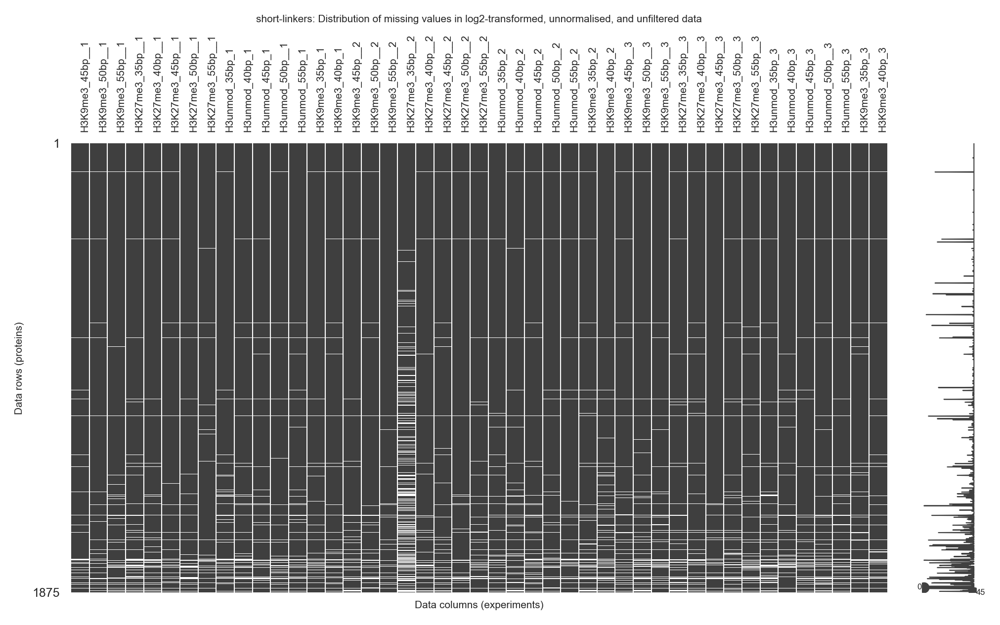

In [16]:
import missingno as msgno

msgno.matrix(data_numeric_log2, figsize=(40*FIVE_MM_IN_INCH, 20*FIVE_MM_IN_INCH), fontsize=5)

plt.title(f"{DATASET}: Distribution of missing values in log2-transformed, unnormalised, and unfiltered data")
plt.xlabel("Data columns (experiments)")
plt.ylabel("Data rows (proteins)")
plt.xticks(rotation=90)

_fname = OUTPUT_DIRECTORY / f'01-EDA-log2-transformed-unnormalised-unfiltered-missing-values.{DATASET}.png'
_caption = f"""
Distribution of missing values in the log2-transformed, unnormalised, and unfiltered data ({DATASET}). 
The heatmap above displays all proteins in the data in rows, and all experiments in columns. Dark values indicate the presence of a value, while white space indicates the absence of one. The sparkline on the right hand side counts the number of values per protein.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

In [17]:
data_numeric_log2.isnull().mean().sort_values(ascending=False).head()

Experiment_Linker_Replicate
H3K27me3_35bp__2    0.171200
H3K9me3_40bp_2      0.049600
H3K27me3_35bp__3    0.044267
H3K27me3_55bp__3    0.042133
H3K9me3_50bp__3     0.042133
dtype: float64

### Normality

The analyses below will assume that the log2-transformed data is approximately normal.

We can qualititatively verify this by plotting the data distributions.

We see that the fit is not perfect but is perhaps acceptable. We will therefore not worry about the normality of the data.

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)



Distribution of non-null values of log2-transformed, unnormalised, and unfiltered dataset (short-linkers). 
The rows facet the four experiment types, while the columns split the data per replicate.
The green distribution plot shows the histogram of observed log2 values in the data.
The black curve shows the corresponding normal distribution fit to the data, whose parameters are written in the top-right corner.
The black vertical line indicates the mean ($\mu$) estimate.



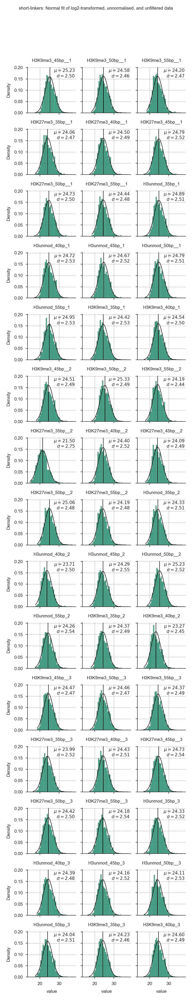

In [18]:
from scipy.stats import norm
def _plot_norm_fit(values, *args, color=None, **kwargs):
    """
    Fits a normal distribution to the data and plots its PDF
    """
    mu, std = norm.fit(values)

    min_ = values.min()
    max_ = values.max()
    
    ax = plt.gca()
    xs = np.linspace(min_, max_, 100)
    ys = norm.pdf(xs, mu, std)
    
    ax.plot(xs, ys, **kwargs, color='black', label='Normal fit')
    ax.axvline(mu, color='black')
    
    ax.text(
        0.98, 0.98, '\n'.join([r'$\mu = {:.2f}$'.format(mu),r'$\sigma = {:.2f}$'.format(std)]),
        ha='right', va='top', transform=ax.transAxes
    )
    
    

# Convert data to long format
_df = data_numeric_log2.copy()
_df = _df.stack(_df.columns.names)
_df.name = 'value'
_df = _df.reset_index()

# Plot the histograms and normal distribution fits
fgrid = sns.FacetGrid(col='Experiment_Linker_Replicate', col_wrap=3, col_order=data_numeric_log2.columns, data=_df, size=FIVE_MM_IN_INCH*5)
fgrid.map(sns.histplot, 'value', stat='density')
fgrid.map(_plot_norm_fit, 'value')
fgrid.set_titles('{col_name}')

plt.suptitle(f"{DATASET}: Normal fit of log2-transformed, unnormalised, and unfiltered data", y=1.05)

_fname = OUTPUT_DIRECTORY / f'01-EDA-log2-transformed-unnormalised-unfiltered-normal-fit.{DATASET}.pdf'
_caption = f"""
Distribution of non-null values of log2-transformed, unnormalised, and unfiltered dataset ({DATASET}). 
The rows facet the four experiment types, while the columns split the data per replicate.
The green distribution plot shows the histogram of observed log2 values in the data.
The black curve shows the corresponding normal distribution fit to the data, whose parameters are written in the top-right corner.
The black vertical line indicates the mean ($\mu$) estimate.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

## PCA

And finally the PCA of unnormalised data


Principal Component embedding of log2-transformed, unnormalised, and unfiltered dataset (short-linkers), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.




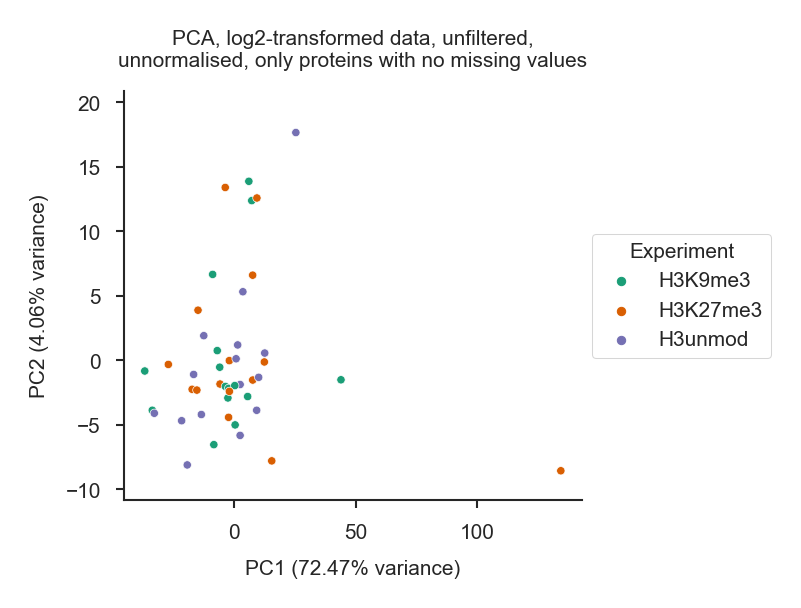

In [21]:
from adjustText import adjust_text
from sklearn.decomposition import PCA

_df = data_numeric_log2

plt.figure()
pca = PCA(n_components=2)

# Note that we only look at the rows that are all not null:
projected = pca.fit_transform(_df.dropna(axis=0).T)

projected = pd.DataFrame(projected, index=_df.columns, columns=['PC1', 'PC2'])
explained_variance = pd.Series(pca.explained_variance_ratio_, index=projected.columns)

ax = plt.gca()

sns.scatterplot(x='PC1', y='PC2', hue='Experiment', data=projected.join(headers_full))

#     texts = []
#     for ix, row in projected.iterrows():
#         texts.append(ax.text(row['PC1'], row['PC2'], ix, ha='center', va='center'))

xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Increasing ylim helps place the H3K4me3 labels
ax.set_ylim(ylim[0]*1.1, ylim[1] * 1.1)

#     adjust_text(texts, projected['PC1'].values, projected['PC2'].values, arrowprops=dict(arrowstyle='-'))

ax.set_xlabel("PC1 ({:.2%} variance)".format(explained_variance.loc['PC1']))
ax.set_ylabel("PC2 ({:.2%} variance)".format(explained_variance.loc['PC2']))
ax.grid(False)
ax.set_title("PCA, log2-transformed data, unfiltered,\nunnormalised, only proteins with no missing values")
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Experiment')


_fname = OUTPUT_DIRECTORY / f'01-EDA-log2-transformed-unnormalised-unfiltered-PCA.{DATASET}.pdf'
_caption = f"""
Principal Component embedding of log2-transformed, unnormalised, and unfiltered dataset ({DATASET}), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.

"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)


Principal Component embedding of log2-transformed, unnormalised, and unfiltered dataset (short-linkers), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.




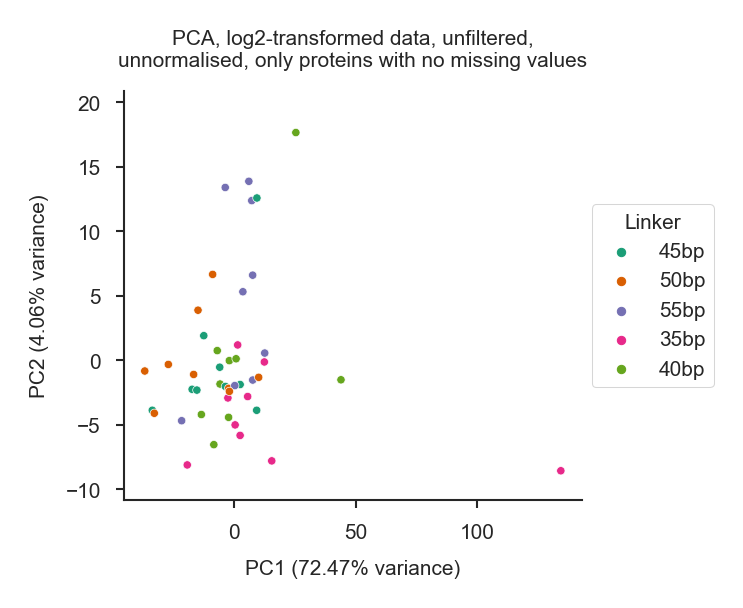

In [23]:
from adjustText import adjust_text
from sklearn.decomposition import PCA

_df = data_numeric_log2

plt.figure()
pca = PCA(n_components=2)

# Note that we only look at the rows that are all not null:
projected = pca.fit_transform(_df.dropna(axis=0).T)

projected = pd.DataFrame(projected, index=_df.columns, columns=['PC1', 'PC2'])
explained_variance = pd.Series(pca.explained_variance_ratio_, index=projected.columns)

ax = plt.gca()

sns.scatterplot(x='PC1', y='PC2', hue='Linker', data=projected.join(headers_full))

#     texts = []
#     for ix, row in projected.iterrows():
#         texts.append(ax.text(row['PC1'], row['PC2'], ix, ha='center', va='center'))

xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Increasing ylim helps place the H3K4me3 labels
ax.set_ylim(ylim[0]*1.1, ylim[1] * 1.1)

#     adjust_text(texts, projected['PC1'].values, projected['PC2'].values, arrowprops=dict(arrowstyle='-'))

ax.set_xlabel("PC1 ({:.2%} variance)".format(explained_variance.loc['PC1']))
ax.set_ylabel("PC2 ({:.2%} variance)".format(explained_variance.loc['PC2']))
ax.grid(False)
ax.set_title("PCA, log2-transformed data, unfiltered,\nunnormalised, only proteins with no missing values")
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Linker')


_fname = OUTPUT_DIRECTORY / f'01-EDA-log2-transformed-unnormalised-unfiltered-PCA.Linker.{DATASET}.pdf'
_caption = f"""
Principal Component embedding of log2-transformed, unnormalised, and unfiltered dataset ({DATASET}), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.

"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

In [24]:
# Clean up memory a bit
plt.close('all')

## Normalisation

For normalisation of these intensities, it makes most sense to normalise to the histone amounts.
The histone proteins that are present in our data:

In [25]:
_df = data_metadata.reset_index()
_df = _df[['Label', 'Description']].drop_duplicates().set_index('Label')

_mask = _df['Description'].str.lower().str.contains('histone')
_mask &= ~(_df['Description'].str.lower().str.contains('transferase'))
_mask &= ~(_df['Description'].str.lower().str.contains('acetylase'))
_mask &= ~(_df['Description'].str.lower().str.contains('methylase'))
_mask &= ~(_df['Description'].str.lower().str.contains('methylation'))
_mask &= ~(_df['Description'].str.lower().str.contains('histone-binding protein'))
_mask &= ~(_df['Description'].str.lower().str.contains('non-histone'))
histone_like_proteins = _df[_mask].sort_index()
histone_like_proteins

,Description
Label,
H1F0,Histone H1.0 OS=Homo sapiens GN=H1F0 PE=1 SV=3
H1FX,Histone H1x OS=Homo sapiens GN=H1FX PE=1 SV=1
H2AFV,Histone H2A.V OS=Homo sapiens GN=H2AFV PE=1 SV=3
H2AFY,Core histone macro-H2A.1 OS=Homo sapiens GN=H2...
HIST1H1C,Histone H1.2 OS=Homo sapiens GN=HIST1H1C PE=1 ...
HIST1H1E,Histone H1.4 OS=Homo sapiens GN=HIST1H1E PE=1 ...
HIST1H4A,Histone H4 OS=Homo sapiens GN=HIST1H4A PE=1 SV=2
HIST2H2AB,Histone H2A type 2-B OS=Homo sapiens GN=HIST2H...
HIST2H2BF,Histone H2B type 2-F OS=Homo sapiens GN=HIST2H...


In [26]:
HISTONES = histone_like_proteins.index

Out of which the most abundant ones are:

In [27]:
data_numeric_log2.reindex(histone_like_proteins.index).mean(axis=1).sort_values(ascending=False)

Label
HIST1H4A     34.537442
HIST2H2BF    33.553141
H1FX         28.498925
H1F0         28.107520
HIST1H1C     26.958870
HIST2H2AB    26.530680
HIST1H1E     26.517543
H2AFV        26.038120
H2AFY        23.151069
dtype: float64

We take a small set of core histone proteins to use for normalisation

In [28]:
# By dataset

NORMALISATION_PROTEINS_BY_DATASET = {
    'short-linkers': ['HIST1H4A', 'HIST2H2BF'],
    'long-linkers-enh': ['H4C1', 'H2BC12'],
    'long-linkers-prom': ['H4C1', 'H2BC12']
}

NORMALISATION_PROTEINS = NORMALISATION_PROTEINS_BY_DATASET[DATASET]

In [29]:
data_numeric_log2_histones = data_numeric_log2.loc[histone_like_proteins.index]

In [30]:
data_numeric_log2_histones

Experiment_Linker_Replicate,H3K9me3_45bp__1,H3K9me3_50bp__1,H3K9me3_55bp__1,H3K27me3_35bp__1,H3K27me3_40bp__1,H3K27me3_45bp__1,H3K27me3_50bp__1,H3K27me3_55bp__1,H3unmod_35bp_1,H3unmod_40bp_1,...,H3K27me3_45bp__3,H3K27me3_50bp__3,H3K27me3_55bp__3,H3unmod_35bp_3,H3unmod_40bp_3,H3unmod_45bp_3,H3unmod_50bp__3,H3unmod_55bp_3,H3K9me3_35bp_3,H3K9me3_40bp_3
Label,,,,,,,,,,,,,,,,,,,,,
H1F0,28.819447,28.496076,28.054134,27.493532,28.101291,28.258103,28.507314,28.190942,28.485844,28.638939,...,28.340636,28.152885,28.109976,27.796522,28.088338,28.124341,28.051037,27.982384,27.906121,28.426505
H1FX,29.377676,28.694856,28.367305,28.162875,28.677651,29.030871,29.033236,28.685622,29.075680,28.878106,...,29.018845,28.495726,28.348906,28.461933,28.304604,28.113604,28.059328,28.028141,28.417226,28.642383
H2AFV,26.903246,26.487945,25.723763,25.460567,25.986858,26.448666,26.449330,26.032969,26.520217,26.410164,...,26.534898,26.126321,25.896927,26.081218,26.253905,25.803154,25.742944,25.663520,25.834889,26.346909
H2AFY,24.128433,23.688869,23.213620,22.995151,22.088181,23.791986,23.549492,22.566863,23.719812,23.365716,...,23.928054,23.581729,23.128539,23.237795,22.349409,23.016300,23.003480,22.919974,23.137678,23.419079
HIST1H1C,27.925268,27.286620,26.617938,26.298459,26.893286,27.128721,27.144010,26.870699,27.151739,27.363683,...,27.154300,26.860193,26.789721,26.889135,26.903900,27.209295,26.986139,26.865003,26.717962,27.389362
HIST1H1E,27.498566,26.859641,26.211565,25.858365,26.413087,26.739332,26.673368,26.455124,26.670977,26.945320,...,26.700560,26.394908,26.254185,26.510690,26.477202,26.803833,26.550762,26.394070,26.237457,26.908380
HIST1H4A,35.340117,35.015732,34.538172,34.159460,34.530859,34.970080,35.051758,34.741759,34.934739,34.809454,...,35.017280,34.595545,34.558282,34.316079,34.478943,34.417448,34.332289,34.245073,34.220475,34.731723
HIST2H2AB,27.186825,27.342967,26.912195,26.354907,26.598189,26.658625,27.322208,27.274357,26.551412,27.073516,...,26.800322,26.935368,26.417643,26.389924,26.855933,26.507416,26.585805,26.184539,26.049226,26.921721
HIST2H2BF,33.984747,33.916774,33.770613,33.300987,33.533834,33.804972,33.644500,33.854499,33.641269,33.912936,...,33.718069,33.602197,33.562096,33.408060,33.756960,33.661896,33.555674,33.485093,33.295965,33.758014



Boxplot showing the unnormalised log2 data for histone proteins only (short-linkers).
The proteins are plotted on the Y axis, and the experiments on the X.

Proteins selected as normalisation factors are highlighted in red.



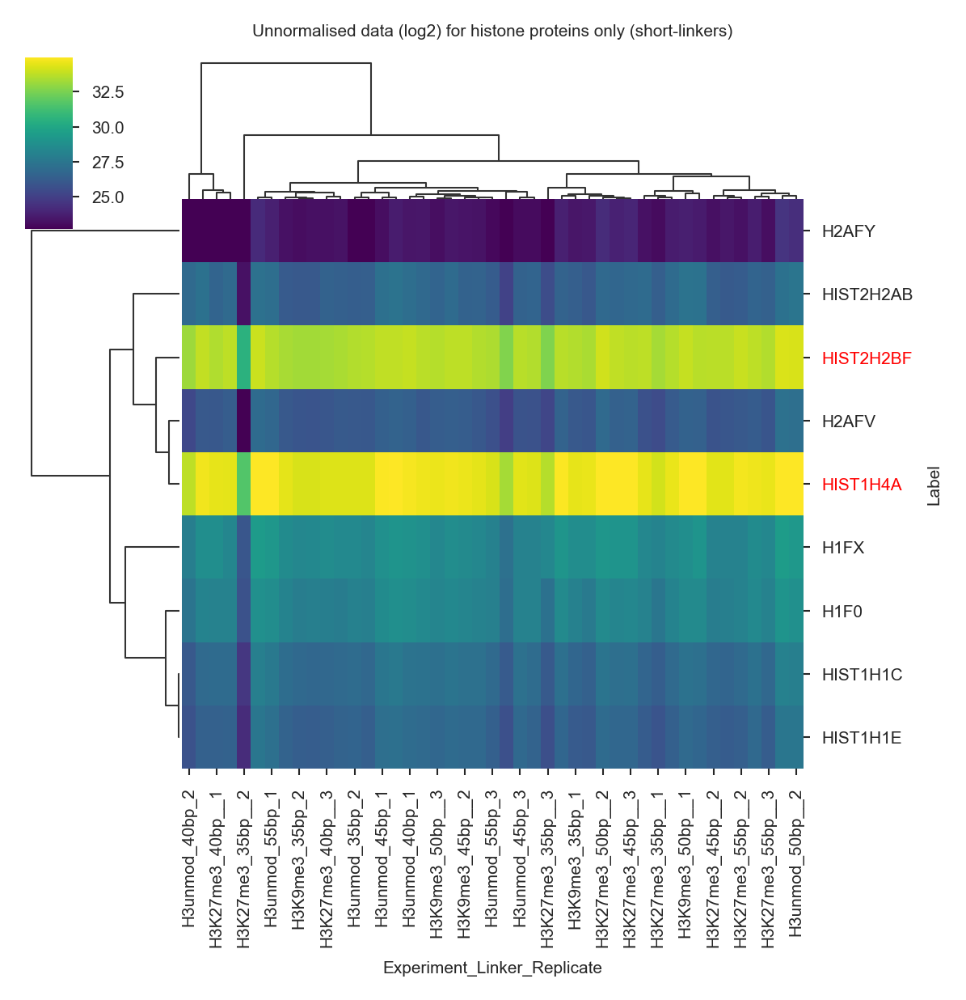

In [31]:
_cmap = sns.clustermap(
    data_numeric_log2_histones.fillna(0),
    mask=data_numeric_log2_histones.isnull(),
    cmap='viridis', robust=True, 
    figsize=(20*FIVE_MM_IN_INCH, 20*FIVE_MM_IN_INCH),
    metric='correlation',
    method='complete',
)
_cmap.ax_col_dendrogram.set_title(f"Unnormalised data (log2) for histone proteins only ({DATASET})")

for tick in _cmap.ax_heatmap.get_yticklabels():
    tick_text = tick.get_text()
    if tick_text in NORMALISATION_PROTEINS:
        tick.set_color('red')

_fname = OUTPUT_DIRECTORY / f'02-normalisation-histones-heatmap-unnormalised.{DATASET}.pdf'
_caption = f"""
Boxplot showing the unnormalised log2 data for histone proteins only ({DATASET}).
The proteins are plotted on the Y axis, and the experiments on the X.

Proteins selected as normalisation factors are highlighted in red.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

Let's Mark NORMALISATION_PROTEINS as "Used for normalisation"

In [32]:
comments_norm = pd.Series(None, dtype=object, index=data_numeric_log2.index)
for norm_prot in NORMALISATION_PROTEINS:
    try:
        comments_norm.loc[norm_prot] = 'Used for normalisation'
    except KeyError:
        continue

To normalise we will take a median of M-offsets from the data, the M-offsets can obtained by subtracting the row-wise mean from the data:

In [33]:
data_numeric_log2.sub(data_numeric_log2.mean(axis=1), axis=0)

Experiment_Linker_Replicate,H3K9me3_45bp__1,H3K9me3_50bp__1,H3K9me3_55bp__1,H3K27me3_35bp__1,H3K27me3_40bp__1,H3K27me3_45bp__1,H3K27me3_50bp__1,H3K27me3_55bp__1,H3unmod_35bp_1,H3unmod_40bp_1,...,H3K27me3_45bp__3,H3K27me3_50bp__3,H3K27me3_55bp__3,H3unmod_35bp_3,H3unmod_40bp_3,H3unmod_45bp_3,H3unmod_50bp__3,H3unmod_55bp_3,H3K9me3_35bp_3,H3K9me3_40bp_3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,1.019329,0.236447,-0.215713,-0.364844,0.076489,0.616531,0.476197,0.151825,0.718453,0.295519,...,0.547540,-0.074813,-0.501693,0.098064,-0.144019,-0.505489,-0.589518,-0.668011,-0.188077,0.067652
CONT_P22629,0.412179,-0.339682,-0.648036,-0.581696,-0.109985,0.099947,-0.066358,-0.219619,0.389297,0.445775,...,0.290762,0.374830,0.241156,-0.012353,0.060750,0.227333,0.251052,0.185024,-0.193818,0.459253
SPTAN1 (1),0.598390,0.165859,0.147595,-0.184028,0.261914,0.132292,0.381863,0.224558,0.474338,0.684349,...,0.214815,0.013219,-0.347605,-0.160631,0.130564,-0.382518,-0.295374,-0.327504,0.018149,0.095864
SPTAN1 (2),1.625559,1.151599,1.751491,-0.561495,-0.041702,0.224907,-0.208596,1.641686,0.265202,-0.157332,...,1.011659,-1.198069,-0.064733,-0.562102,-1.301431,0.348341,0.215020,-0.174445,-0.561622,-0.209845
SPTBN1,1.100606,0.121617,-0.055527,-0.333602,0.131815,0.521718,0.415682,0.148773,0.805006,0.548541,...,0.543756,-0.123784,-0.442406,0.061555,-0.060113,-0.343117,-0.327293,-0.439117,-0.156920,0.191502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPIH,0.530417,-0.013525,-0.300433,-0.639048,0.277707,0.786840,0.549968,0.257885,0.746247,0.177068,...,0.552946,-0.153776,-0.018898,0.197267,-0.139006,-0.217670,-0.509286,-0.056066,0.099071,0.295775
REST,1.320597,0.558178,0.241391,-0.369133,-0.815597,-0.378190,-0.133688,0.436503,-0.632339,-0.728838,...,-0.172585,-0.756216,-0.878625,0.016110,0.160250,-0.432736,0.134836,-1.115438,-0.096838,0.246285
ZMYM2,0.629111,0.275368,-0.380389,-0.208602,0.013519,-0.280435,NaN,-0.273693,NaN,-0.497941,...,-0.079523,-0.247868,-0.047280,-0.003345,-0.285517,-0.103152,0.117566,0.261621,-0.163088,0.526061


## Normalisation factors calculation

We will now compute the MA statistics from the unnormalised data.

MA statistics are simply row-wise averages of the data (avg column, the A part) And the log2 offsets from this average (log2_diff column, the M part)

In [34]:
data_numeric_log2_row_averages = data_numeric_log2.mean(axis=1)
data_numeric_log2_row_averages.name = 'avg'
    
data_numeric_log2_row_averages

Label
MYH9           31.647788
CONT_P22629    36.876295
SPTAN1 (1)     28.018058
SPTAN1 (2)     24.903903
SPTBN1         28.549182
                 ...    
PPIH           22.438312
REST           21.784952
ZMYM2          21.367573
RYR2           26.002230
NES            23.566516
Name: avg, Length: 1875, dtype: float64

In [35]:
data_numeric_log2.head()

Experiment_Linker_Replicate,H3K9me3_45bp__1,H3K9me3_50bp__1,H3K9me3_55bp__1,H3K27me3_35bp__1,H3K27me3_40bp__1,H3K27me3_45bp__1,H3K27me3_50bp__1,H3K27me3_55bp__1,H3unmod_35bp_1,H3unmod_40bp_1,...,H3K27me3_45bp__3,H3K27me3_50bp__3,H3K27me3_55bp__3,H3unmod_35bp_3,H3unmod_40bp_3,H3unmod_45bp_3,H3unmod_50bp__3,H3unmod_55bp_3,H3K9me3_35bp_3,H3K9me3_40bp_3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,32.667117,31.884235,31.432075,31.282944,31.724277,32.264319,32.123985,31.799613,32.366241,31.943307,...,32.195328,31.572975,31.146095,31.745852,31.503769,31.142299,31.058270,30.979777,31.459711,31.715440
CONT_P22629,37.288475,36.536613,36.228259,36.294599,36.766310,36.976242,36.809937,36.656676,37.265592,37.322070,...,37.167057,37.251125,37.117451,36.863943,36.937045,37.103628,37.127348,37.061319,36.682478,37.335549
SPTAN1 (1),28.616447,28.183917,28.165652,27.834030,28.279971,28.150349,28.399920,28.242616,28.492395,28.702407,...,28.232873,28.031277,27.670453,27.857426,28.148621,27.635539,27.722683,27.690553,28.036207,28.113921
SPTAN1 (2),26.529462,26.055502,26.655394,24.342407,24.862201,25.128810,24.695307,26.545589,25.169105,24.746571,...,25.915562,23.705834,24.839170,24.341801,23.602472,25.252244,25.118923,24.729458,24.342281,24.694058
SPTBN1,29.649788,28.670799,28.493655,28.215580,28.680997,29.070900,28.964864,28.697955,29.354187,29.097723,...,29.092938,28.425397,28.106776,28.610737,28.489069,28.206065,28.221888,28.110064,28.392262,28.740684


In [36]:
data_numeric_log2_diffs = data_numeric_log2.sub(data_numeric_log2_row_averages, axis=0)
data_numeric_log2_diffs

Experiment_Linker_Replicate,H3K9me3_45bp__1,H3K9me3_50bp__1,H3K9me3_55bp__1,H3K27me3_35bp__1,H3K27me3_40bp__1,H3K27me3_45bp__1,H3K27me3_50bp__1,H3K27me3_55bp__1,H3unmod_35bp_1,H3unmod_40bp_1,...,H3K27me3_45bp__3,H3K27me3_50bp__3,H3K27me3_55bp__3,H3unmod_35bp_3,H3unmod_40bp_3,H3unmod_45bp_3,H3unmod_50bp__3,H3unmod_55bp_3,H3K9me3_35bp_3,H3K9me3_40bp_3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,1.019329,0.236447,-0.215713,-0.364844,0.076489,0.616531,0.476197,0.151825,0.718453,0.295519,...,0.547540,-0.074813,-0.501693,0.098064,-0.144019,-0.505489,-0.589518,-0.668011,-0.188077,0.067652
CONT_P22629,0.412179,-0.339682,-0.648036,-0.581696,-0.109985,0.099947,-0.066358,-0.219619,0.389297,0.445775,...,0.290762,0.374830,0.241156,-0.012353,0.060750,0.227333,0.251052,0.185024,-0.193818,0.459253
SPTAN1 (1),0.598390,0.165859,0.147595,-0.184028,0.261914,0.132292,0.381863,0.224558,0.474338,0.684349,...,0.214815,0.013219,-0.347605,-0.160631,0.130564,-0.382518,-0.295374,-0.327504,0.018149,0.095864
SPTAN1 (2),1.625559,1.151599,1.751491,-0.561495,-0.041702,0.224907,-0.208596,1.641686,0.265202,-0.157332,...,1.011659,-1.198069,-0.064733,-0.562102,-1.301431,0.348341,0.215020,-0.174445,-0.561622,-0.209845
SPTBN1,1.100606,0.121617,-0.055527,-0.333602,0.131815,0.521718,0.415682,0.148773,0.805006,0.548541,...,0.543756,-0.123784,-0.442406,0.061555,-0.060113,-0.343117,-0.327293,-0.439117,-0.156920,0.191502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPIH,0.530417,-0.013525,-0.300433,-0.639048,0.277707,0.786840,0.549968,0.257885,0.746247,0.177068,...,0.552946,-0.153776,-0.018898,0.197267,-0.139006,-0.217670,-0.509286,-0.056066,0.099071,0.295775
REST,1.320597,0.558178,0.241391,-0.369133,-0.815597,-0.378190,-0.133688,0.436503,-0.632339,-0.728838,...,-0.172585,-0.756216,-0.878625,0.016110,0.160250,-0.432736,0.134836,-1.115438,-0.096838,0.246285
ZMYM2,0.629111,0.275368,-0.380389,-0.208602,0.013519,-0.280435,NaN,-0.273693,NaN,-0.497941,...,-0.079523,-0.247868,-0.047280,-0.003345,-0.285517,-0.103152,0.117566,0.261621,-0.163088,0.526061


In [37]:

data_numeric_log2_ma = data_numeric_log2_diffs.stack()
data_numeric_log2_ma.name = 'log2_diff'
data_numeric_log2_ma = data_numeric_log2_ma.reset_index().join(data_numeric_log2_row_averages, on='Label')
data_numeric_log2_ma

,Label,Experiment_Linker_Replicate,log2_diff,avg
0,MYH9,H3K9me3_45bp__1,1.019329,31.647788
1,MYH9,H3K9me3_50bp__1,0.236447,31.647788
2,MYH9,H3K9me3_55bp__1,-0.215713,31.647788
3,MYH9,H3K27me3_35bp__1,-0.364844,31.647788
4,MYH9,H3K27me3_40bp__1,0.076489,31.647788
...,...,...,...,...
81345,NES,H3unmod_45bp_3,0.129487,23.566516
81346,NES,H3unmod_50bp__3,0.192323,23.566516
81347,NES,H3unmod_55bp_3,0.190655,23.566516
81348,NES,H3K9me3_35bp_3,0.291095,23.566516


We will now compute the normalisation factors from the NORMALISATION_PROTEINS.

We take the median of the M offsets of the NORMALISATION_PROTEINS

In [38]:
# Get the normfactors from MA offsets
_ma_data_for_normalisation_proteins = data_numeric_log2_ma[
    data_numeric_log2_ma['Label'].isin(NORMALISATION_PROTEINS)
]

normalisation_factors = _ma_data_for_normalisation_proteins.groupby('Experiment_Linker_Replicate')['log2_diff'].median()


In [39]:
normalisation_factors

Experiment_Linker_Replicate
H3K27me3_35bp__1   -0.315068
H3K27me3_35bp__2   -2.967458
H3K27me3_35bp__3   -0.931586
H3K27me3_40bp__1   -0.012945
H3K27me3_40bp__2   -0.047123
H3K27me3_40bp__3   -0.234952
H3K27me3_45bp__1    0.342234
H3K27me3_45bp__2    0.037177
H3K27me3_45bp__3    0.322383
H3K27me3_50bp__1    0.302838
H3K27me3_50bp__2    0.658399
H3K27me3_50bp__3    0.053580
H3K27me3_55bp__1    0.252838
H3K27me3_55bp__2    0.327027
H3K27me3_55bp__3    0.014898
H3K9me3_35bp_1     -0.002629
H3K9me3_35bp_2     -0.298472
H3K9me3_35bp_3     -0.287071
H3K9me3_40bp_1      0.143646
H3K9me3_40bp_2     -1.068731
H3K9me3_40bp_3      0.199577
H3K9me3_45bp__1     0.617140
H3K9me3_45bp__2     0.135054
H3K9me3_45bp__3     0.176132
H3K9me3_50bp__1     0.420961
H3K9me3_50bp__2     0.874221
H3K9me3_50bp__3     0.090546
H3K9me3_55bp__1     0.109101
H3K9me3_55bp__2     0.026321
H3K9me3_55bp__3    -0.121777
H3unmod_35bp_1      0.242713
H3unmod_35bp_2     -0.080073
H3unmod_35bp_3     -0.183222
H3unmod_40bp_1 

## Plots (before)

## MA

To illustrate the normalisation behaviour it is helpful to make some MA plots:

In [40]:
# Clean up memory a bit
plt.close('all')

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)

MA-like plot for log2-transformed, unnormalised and unfiltered data (short-linkers).

X axis plots mean(log2_intensity) across data rows (proteins). X axis is the same in every plot.
Y axis plots log2_intensity - mean(log2_intensity) offsets for individual samples

Histone proteins are highlighted in green.
Red line indicates the normalisation factor estimate.



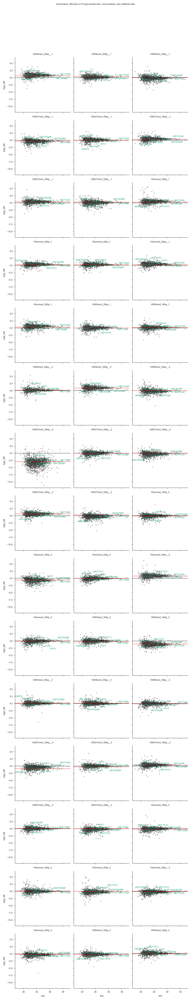

In [41]:
from adjustText import adjust_text
def annotate_histones(x, y, *, color=None, data=None):
    data_histones = data[data['Label'].isin(HISTONES)]
    ax = plt.gca()
    
    print(data_histones.shape)
    ax.scatter(data_histones[x], data_histones[y], color=color)
    
    texts = []
    for __, row in data_histones.iterrows():
        texts.append(ax.text(row[x], row[y], row['Label'], color=color))
        
    adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)
    
def add_horizontal_line(*args, color=None, data=None):
    ax = plt.gca()
    ax.axhline(0, linestyle='-',color='black', zorder=1)

    
fgrid = sns.FacetGrid(col='Experiment_Linker_Replicate', col_wrap=3,
                      size=FIVE_MM_IN_INCH*10,
                      col_order=data_numeric_log2.columns, data=data_numeric_log2_ma)
fgrid.map(sns.scatterplot, 'avg', 'log2_diff', alpha=.4, color='black', rasterized=True)
fgrid.map_dataframe(annotate_histones, 'avg', 'log2_diff')
fgrid.map_dataframe(add_horizontal_line)
fgrid.set_titles('{col_name}')

for experiment, ax in fgrid.axes_dict.items():
    ax.axhline(normalisation_factors.loc[experiment], color='r', linestyle='-')
    ax.grid(False)

plt.suptitle(f"{DATASET}: MA plots of of log2-transformed, unnormalised, and unfiltered data", y=1.05)

_fname = OUTPUT_DIRECTORY / f'02-normalisation-log2-transformed-unnormalised-unfiltered-ma-plot.{DATASET}.pdf'
_caption = f"""
MA-like plot for log2-transformed, unnormalised and unfiltered data ({DATASET}).

X axis plots mean(log2_intensity) across data rows (proteins). X axis is the same in every plot.
Y axis plots log2_intensity - mean(log2_intensity) offsets for individual samples

Histone proteins are highlighted in green.
Red line indicates the normalisation factor estimate.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

# Boxplot

Alternatively, we can plot all of this in a boxplot format:


Boxplot showing the distribution of signal intensities for non-histone proteins (green), and the histone proteins (orange), prior to normalisation (short-linkers).
The intensity is plotted on the X axis, while the samples are facetted on the Y. The outliers ("fliers") are hidden.

Black line shows the estimated normalisation offsets centred around the mean of normalisation proteins.



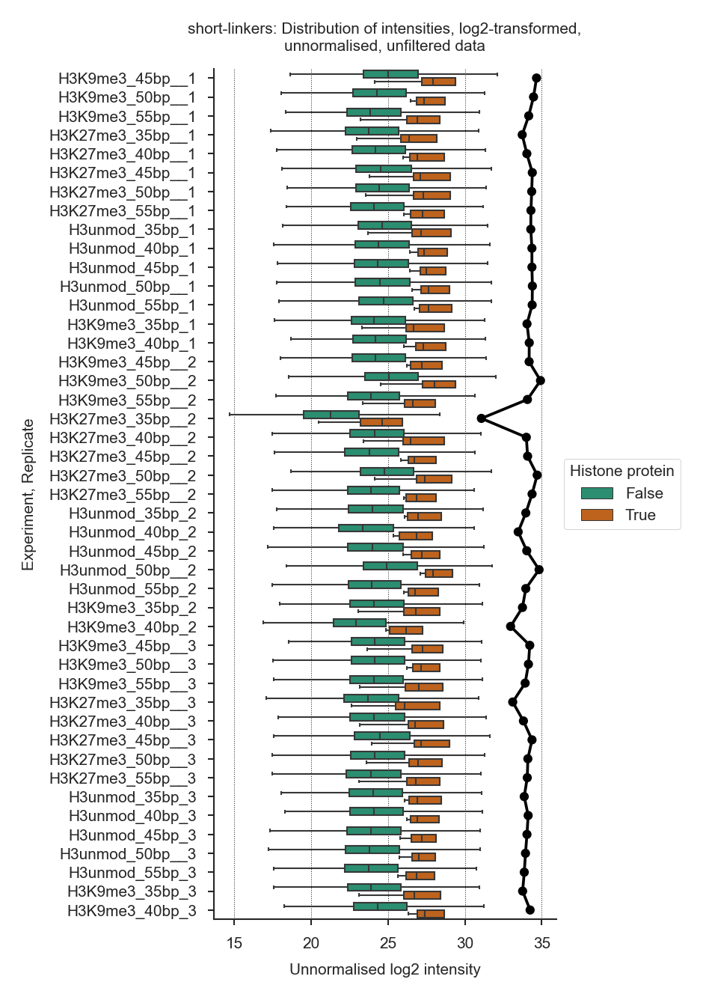

In [42]:

_df = data_numeric_log2.stack(list(data_numeric_log2.columns.names)).copy()
_df.name = 'log2_intensity_unnormalised'
_df = _df.reset_index()

_df['is_histone'] = False
_df.loc[_df['Label'].isin(HISTONES), 'is_histone'] = True

_df_cov = pd.DataFrame(
    # The + below recentres the normalisation factors around the mean of normalisation proteins
    {'normalisation_factors': normalisation_factors + data_numeric_log2.reindex(NORMALISATION_PROTEINS).mean(axis=1).mean()}, 
)

fig = plt.figure(figsize=(10*FIVE_MM_IN_INCH, 25*FIVE_MM_IN_INCH))
ax = plt.gca()

sns.pointplot(
    y='Experiment_Linker_Replicate', x='normalisation_factors', 
    data=_df_cov.reset_index(),
    order=data_numeric_log2.columns,
    marker='.',
    color='black',
    label="Estimated covariates",
)

sns.boxplot(
    y='Experiment_Linker_Replicate', x='log2_intensity_unnormalised', 
    data=_df, hue='is_histone', showfliers=False,
    order=data_numeric_log2.columns,
)


ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Histone protein")
ax.set_xlabel("Unnormalised log2 intensity")
ax.set_ylabel("Experiment, Replicate")
ax.set_title(f"{DATASET}: Distribution of intensities, log2-transformed,\nunnormalised, unfiltered data")

_fname = OUTPUT_DIRECTORY / f'02-normalisation-boxplot.{DATASET}.pdf'
_caption = f"""
Boxplot showing the distribution of signal intensities for non-histone proteins (green), and the histone proteins (orange), prior to normalisation ({DATASET}).
The intensity is plotted on the X axis, while the samples are facetted on the Y. The outliers ("fliers") are hidden.

Black line shows the estimated normalisation offsets centred around the mean of normalisation proteins.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

## The bit where normalisation is performed

To perform the normalisation we simply subtract the normalisation factors from the dataset.

Note that as we are using (zero-centred) offsets for the normalisation, the intuitive meaning of the normalised intensities stays more or less the same.

In [43]:
data_numeric_log2_normalised = data_numeric_log2 - normalisation_factors
# In the row below we need to make sure column order stays the same
data_numeric_log2_normalised = data_numeric_log2_normalised[data_numeric_log2.columns]

Sanity check:

In [44]:
from numpy.testing import assert_array_equal

# The minus operator above works columnwise, we can confirm this
for col in data_numeric_log2_normalised:
    assert_array_equal(data_numeric_log2_normalised[col], data_numeric_log2[col] - normalisation_factors.loc[col])

    

The normalisation has the effect of making the normalisation protein M-offsets constant (though not necessarily zero, as median is used, not mean):

In [45]:
data_numeric_log2_normalised.sub(data_numeric_log2_normalised.mean(axis=1), axis=0).reindex(NORMALISATION_PROTEINS).dropna(how='all')

Experiment_Linker_Replicate,H3K9me3_45bp__1,H3K9me3_50bp__1,H3K9me3_55bp__1,H3K27me3_35bp__1,H3K27me3_40bp__1,H3K27me3_45bp__1,H3K27me3_50bp__1,H3K27me3_55bp__1,H3unmod_35bp_1,H3unmod_40bp_1,...,H3K27me3_45bp__3,H3K27me3_50bp__3,H3K27me3_55bp__3,H3unmod_35bp_3,H3unmod_40bp_3,H3unmod_45bp_3,H3unmod_50bp__3,H3unmod_55bp_3,H3K9me3_35bp_3,H3K9me3_40bp_3
Label,,,,,,,,,,,,,,,,,,,,,
HIST1H4A,0.185534,0.057328,-0.108371,-0.062914,0.006362,0.090404,0.211478,-0.048521,0.154585,-0.043892,...,0.157455,0.004524,0.005943,-0.038141,-0.131159,-0.114374,-0.103843,-0.11216,-0.029895,-0.005296
HIST2H2BF,-0.185534,-0.057328,0.108371,0.062914,-0.006362,-0.090404,-0.211478,0.048521,-0.154585,0.043892,...,-0.157455,-0.004524,-0.005943,0.038141,0.131159,0.114374,0.103843,0.11216,0.029895,0.005296


In [46]:
data_numeric_log2_normalised.sub(data_numeric_log2_normalised.mean(axis=1), axis=0).reindex(NORMALISATION_PROTEINS).dropna(how='all').median()

Experiment_Linker_Replicate
H3K9me3_45bp__1     0.000000e+00
H3K9me3_50bp__1     7.105427e-15
H3K9me3_55bp__1     3.552714e-15
H3K27me3_35bp__1    3.552714e-15
H3K27me3_40bp__1    3.552714e-15
H3K27me3_45bp__1    7.105427e-15
H3K27me3_50bp__1    3.552714e-15
H3K27me3_55bp__1    3.552714e-15
H3unmod_35bp_1      7.105427e-15
H3unmod_40bp_1      7.105427e-15
H3unmod_45bp_1      0.000000e+00
H3unmod_50bp__1     7.105427e-15
H3unmod_55bp_1      3.552714e-15
H3K9me3_35bp_1      3.552714e-15
H3K9me3_40bp_1      3.552714e-15
H3K9me3_45bp__2     3.552714e-15
H3K9me3_50bp__2     3.552714e-15
H3K9me3_55bp__2     3.552714e-15
H3K27me3_35bp__2    7.105427e-15
H3K27me3_40bp__2    0.000000e+00
H3K27me3_45bp__2    7.105427e-15
H3K27me3_50bp__2    3.552714e-15
H3K27me3_55bp__2    3.552714e-15
H3unmod_35bp_2      3.552714e-15
H3unmod_40bp_2      7.105427e-15
H3unmod_45bp_2      3.552714e-15
H3unmod_50bp__2     3.552714e-15
H3unmod_55bp_2      3.552714e-15
H3K9me3_35bp_2      0.000000e+00
H3K9me3_40bp_2 

## Plots (After)


Boxplot showing the distribution of signal intensities for non-histone proteins (green), and the histone proteins (orange), after  normalisation by the mean of histone protein intensities (short-linkers).
The intensity is plotted on the X axis, while the samples are facetted on the Y. The outliers ("fliers") are hidden.



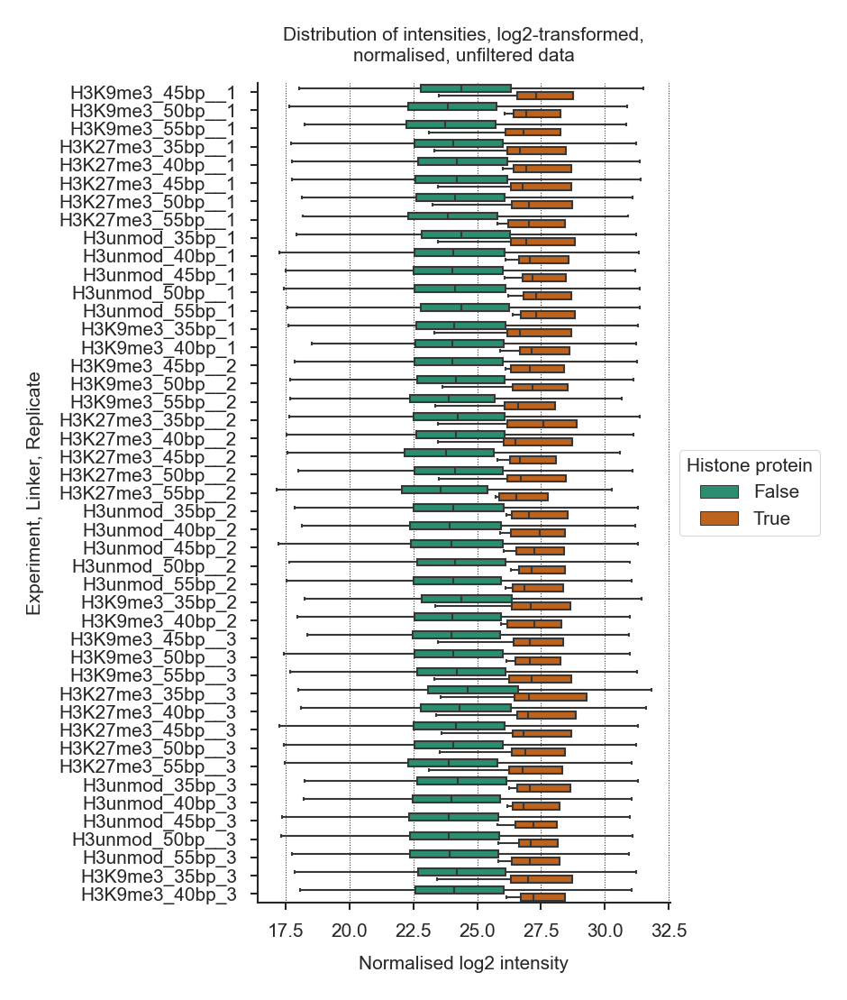

In [47]:

_df = data_numeric_log2_normalised.stack(list(data_numeric_log2.columns.names)).copy()
_df.name = 'log2_intensity_normalised'
_df = _df.reset_index()

_df['is_histone'] = False
_df.loc[_df['Label'].isin(HISTONES), 'is_histone'] = True


fig = plt.figure(figsize=(10*FIVE_MM_IN_INCH, 20*FIVE_MM_IN_INCH))
ax = plt.gca()

sns.boxplot(
    y='Experiment_Linker_Replicate', x='log2_intensity_normalised', 
    data=_df, hue='is_histone', showfliers=False,
    order=data_numeric_log2.columns,
)


ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Histone protein")
ax.set_xlabel("Normalised log2 intensity")
ax.set_ylabel("Experiment, Linker, Replicate")
ax.set_title("Distribution of intensities, log2-transformed,\nnormalised, unfiltered data")

_fname = OUTPUT_DIRECTORY / f'02-normalisation-boxplot-post-normalisation.{DATASET}.pdf'
_caption = f"""
Boxplot showing the distribution of signal intensities for non-histone proteins (green), and the histone proteins (orange), after  normalisation by the mean of histone protein intensities ({DATASET}).
The intensity is plotted on the X axis, while the samples are facetted on the Y. The outliers ("fliers") are hidden.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

#### Histone heatmap
Let's replot histone heatmap after normalisation


Boxplot showing the unnormalised log2 data for histone proteins only (short-linkers).
The proteins are plotted on the Y axis, and the experiments on the X.

Proteins selected as normalisation factors are highlighted in red.



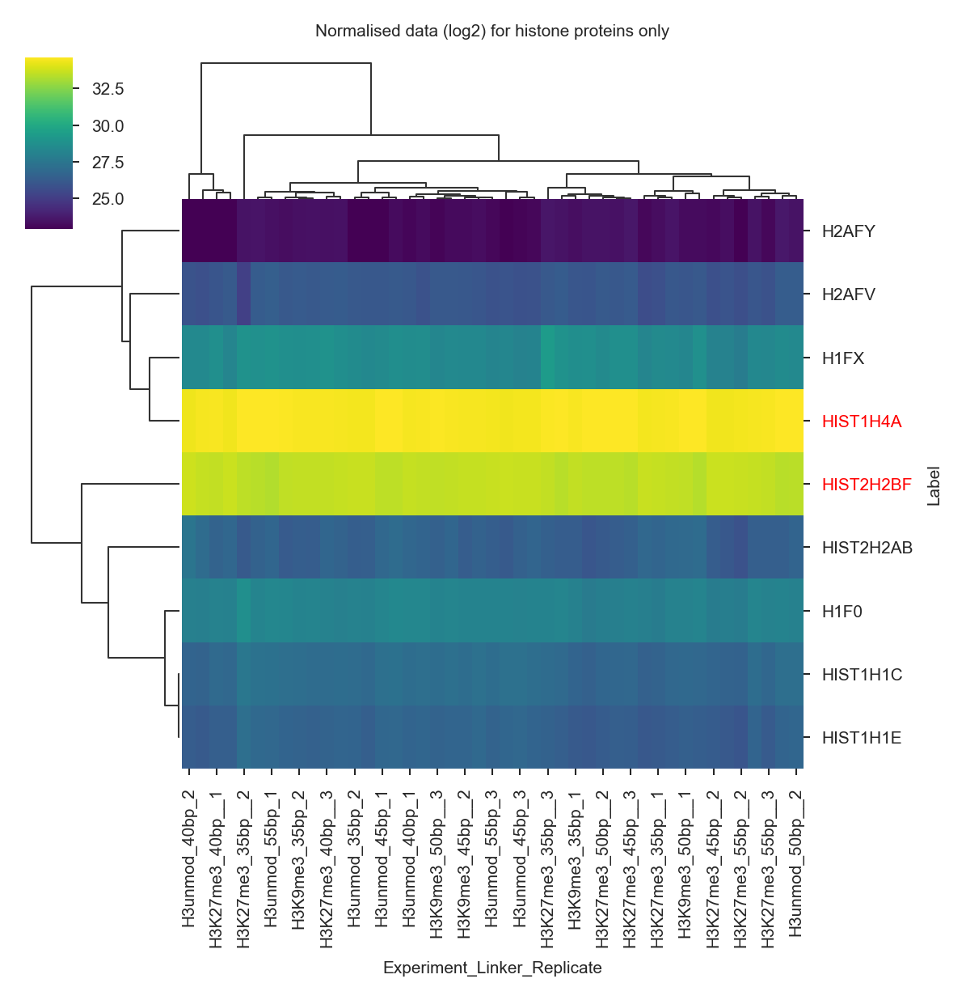

In [48]:
_mtrix = data_numeric_log2_normalised.reindex(HISTONES).dropna(how='all')
_cmap = sns.clustermap(
    _mtrix.fillna(0),
    mask=_mtrix.isnull(),
    cmap='viridis', robust=True, 
    figsize=(20*FIVE_MM_IN_INCH, 20*FIVE_MM_IN_INCH),
    metric='correlation',
    method='complete',
)
_cmap.ax_col_dendrogram.set_title("Normalised data (log2) for histone proteins only")

for tick in _cmap.ax_heatmap.get_yticklabels():
    tick_text = tick.get_text()
    if tick_text in NORMALISATION_PROTEINS:
        tick.set_color('red')

_fname = OUTPUT_DIRECTORY / f'02-normalisation-histones-heatmap-post-normalisation.{DATASET}.pdf'
_caption = f"""
Boxplot showing the unnormalised log2 data for histone proteins only ({DATASET}).
The proteins are plotted on the Y axis, and the experiments on the X.

Proteins selected as normalisation factors are highlighted in red.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

#### MA 

In [49]:
data_numeric_log2_normalised_row_averages = data_numeric_log2_normalised.mean(axis=1)
data_numeric_log2_normalised_row_averages.name = 'avg'
  

In [50]:
data_numeric_log2_normalised_row_averages

Label
MYH9           31.647788
CONT_P22629    36.876295
SPTAN1 (1)     28.018058
SPTAN1 (2)     24.903903
SPTBN1         28.549182
                 ...    
PPIH           22.370870
REST           21.717510
ZMYM2          21.282435
RYR2           26.002230
NES            23.566516
Name: avg, Length: 1875, dtype: float64

In [51]:
data_numeric_log2_normalised_diffs = data_numeric_log2_normalised.sub(data_numeric_log2_normalised_row_averages, axis=0)


In [52]:

data_numeric_log2_normalised_ma = data_numeric_log2_normalised_diffs.stack()
data_numeric_log2_normalised_ma.name = 'log2_diff'
data_numeric_log2_normalised_ma = data_numeric_log2_normalised_ma.reset_index().join(data_numeric_log2_normalised_row_averages, on='Label')


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)
(9, 4)

MA-like plot for log2-transformed, normalised and unfiltered data (short-linkers)

X axis plots mean(log2_intensity) across data rows (proteins). X axis is the same in every plot.
Y axis plots log2_intensity - mean(log2_intensity) offsets for individual samples

Histone proteins are highlighted in green.

Red line indicates x=0 line around which the data is centered now.



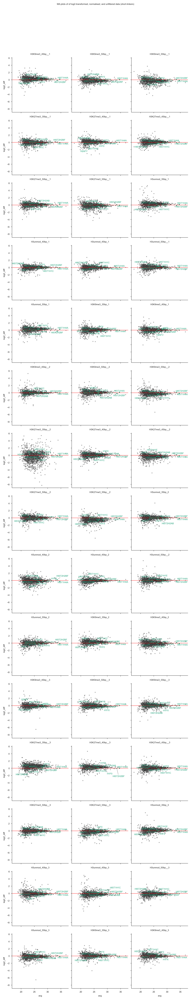

In [53]:
fgrid = sns.FacetGrid(col='Experiment_Linker_Replicate', col_wrap=3,
                      size=FIVE_MM_IN_INCH*10,
                      col_order=data_numeric_log2.columns, data=data_numeric_log2_normalised_ma)
fgrid.map(sns.scatterplot, 'avg', 'log2_diff', alpha=.4, color='black')
fgrid.map_dataframe(annotate_histones, 'avg', 'log2_diff')
# fgrid.map_dataframe(add_horizontal_line)
fgrid.set_titles('{col_name}')
for experiment, ax in fgrid.axes_dict.items():
    ax.axhline(0, linestyle='-', color='red', zorder=1)
    ax.grid(False)

plt.suptitle(f"MA plots of of log2-transformed, normalised, and unfiltered data ({DATASET})", y=1.05)

_fname = OUTPUT_DIRECTORY / f'02-normalisation-log2-transformed-normalised-unfiltered-ma-plot.{DATASET}.pdf'
_caption = f"""
MA-like plot for log2-transformed, normalised and unfiltered data ({DATASET})

X axis plots mean(log2_intensity) across data rows (proteins). X axis is the same in every plot.
Y axis plots log2_intensity - mean(log2_intensity) offsets for individual samples

Histone proteins are highlighted in green.

Red line indicates x=0 line around which the data is centered now.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

#### Correlation matrix


A Pearson correlation matrix showing the coerrelation coefficient estimate,
for the datasets, after normalisation (short-linkers). 



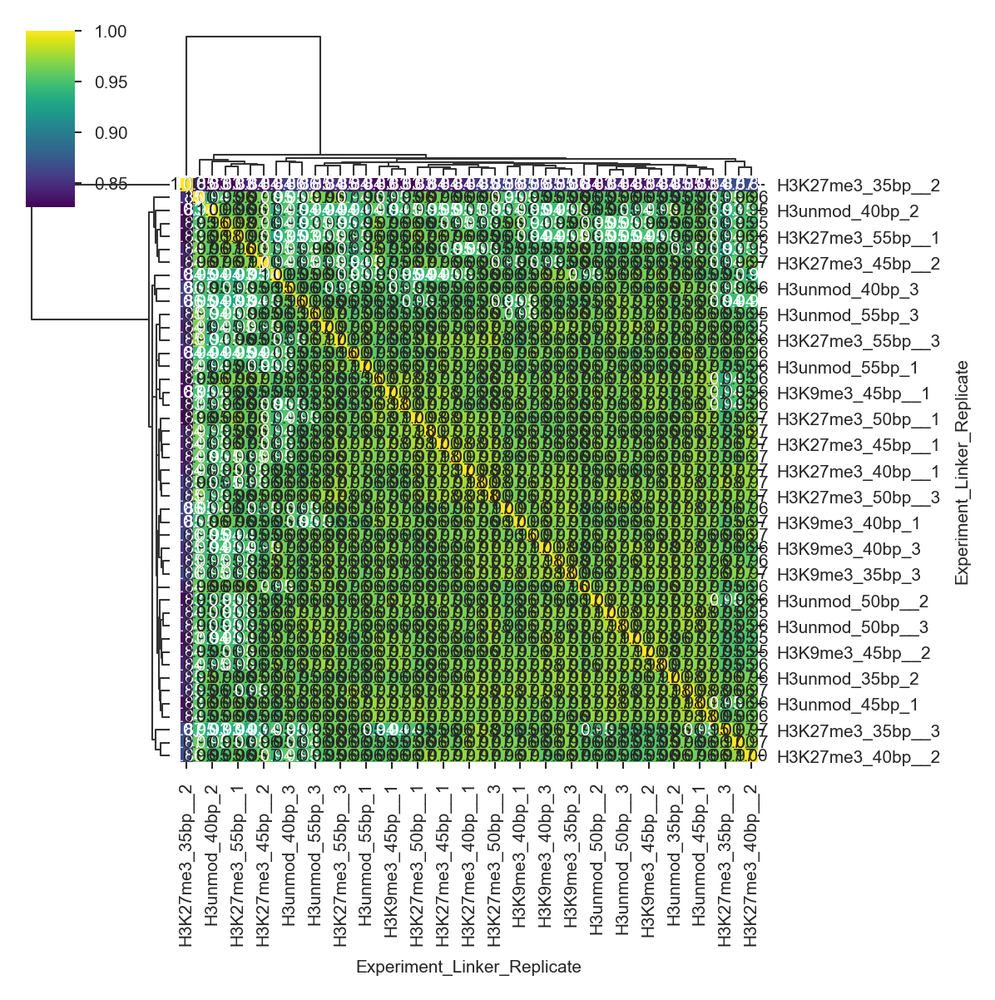

In [54]:
sns.clustermap(data_numeric_log2_normalised.corr(), 
           cmap='viridis', 
           annot=True, fmt='.2f',
           figsize=(FIVE_MM_IN_INCH*20, FIVE_MM_IN_INCH*20))

_fname = OUTPUT_DIRECTORY / f'02-correlation-matrix-of-normalised-data.{DATASET}.pdf'
_caption = f"""
A Pearson correlation matrix showing the coerrelation coefficient estimate,
for the datasets, after normalisation ({DATASET}). 
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

#### PCA

We can also observe how the PCA plot changes after the normalisation


Principal Component embedding of log2-transformed, normalised, and unfiltered dataset (short-linkers), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.



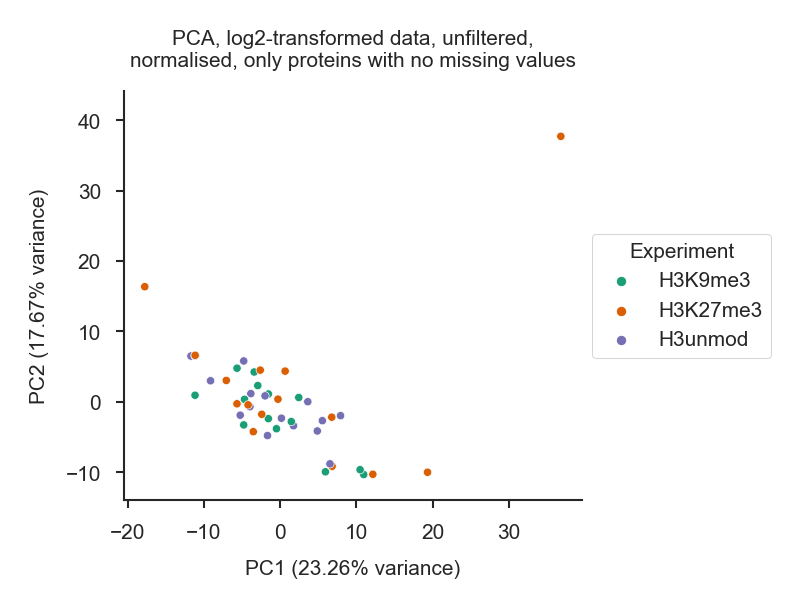

In [56]:
from adjustText import adjust_text
from sklearn.decomposition import PCA

    
plt.figure()
pca = PCA(n_components=2)

# Note that we only look at the rows that are all not null:
projected = pca.fit_transform(data_numeric_log2_normalised.dropna(axis=0).T)

projected = pd.DataFrame(projected, index=data_numeric_log2_normalised.columns, columns=['PC1', 'PC2'])
explained_variance = pd.Series(pca.explained_variance_ratio_, index=projected.columns)

ax = plt.gca()

sns.scatterplot(x='PC1', y='PC2', hue='Experiment', data=projected.join(headers_full))

texts = []
#     for ix, row in projected.iterrows():
#         texts.append(ax.text(row['PC1'], row['PC2'], ix, ha='center', va='center'))

xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Increasing ylim helps place the H3K4me3 labels
ax.set_ylim(ylim[0]*1.1, ylim[1] * 1.1)

adjust_text(texts, projected['PC1'].values, projected['PC2'].values, arrowprops=dict(arrowstyle='-'))

ax.set_xlabel("PC1 ({:.2%} variance)".format(explained_variance.loc['PC1']))
ax.set_ylabel("PC2 ({:.2%} variance)".format(explained_variance.loc['PC2']))
ax.grid(False)
ax.set_title("PCA, log2-transformed data, unfiltered,\nnormalised, only proteins with no missing values")
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Experiment')


_fname = OUTPUT_DIRECTORY / f'02-normalisation-PCA-post-normalisation.{DATASET}.pdf'
_caption = f"""
Principal Component embedding of log2-transformed, normalised, and unfiltered dataset ({DATASET}), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)


Principal Component embedding of log2-transformed, normalised, and unfiltered dataset (short-linkers), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.



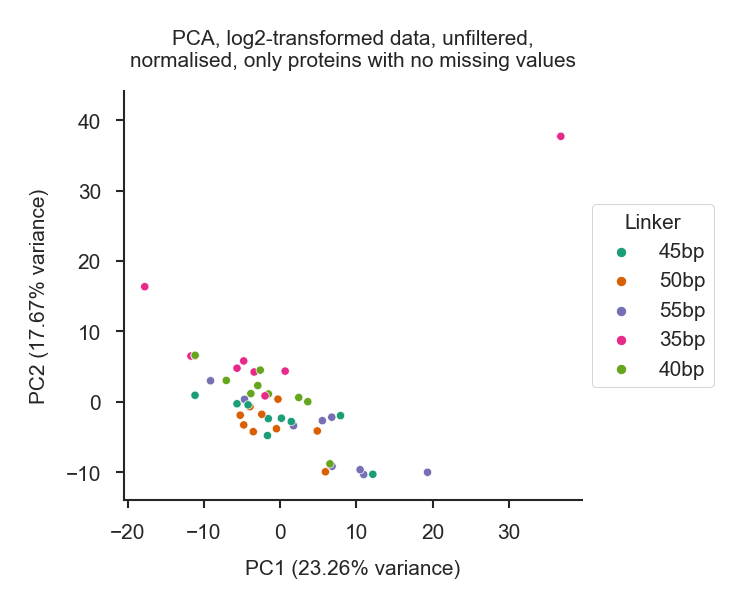

In [57]:
from adjustText import adjust_text
from sklearn.decomposition import PCA

    
plt.figure()
pca = PCA(n_components=2)

# Note that we only look at the rows that are all not null:
projected = pca.fit_transform(data_numeric_log2_normalised.dropna(axis=0).T)

projected = pd.DataFrame(projected, index=data_numeric_log2_normalised.columns, columns=['PC1', 'PC2'])
explained_variance = pd.Series(pca.explained_variance_ratio_, index=projected.columns)

ax = plt.gca()

sns.scatterplot(x='PC1', y='PC2', hue='Linker', data=projected.join(headers_full))

texts = []
#     for ix, row in projected.iterrows():
#         texts.append(ax.text(row['PC1'], row['PC2'], ix, ha='center', va='center'))

xlim = ax.get_xlim()
ylim = ax.get_ylim()

# Increasing ylim helps place the H3K4me3 labels
ax.set_ylim(ylim[0]*1.1, ylim[1] * 1.1)

adjust_text(texts, projected['PC1'].values, projected['PC2'].values, arrowprops=dict(arrowstyle='-'))

ax.set_xlabel("PC1 ({:.2%} variance)".format(explained_variance.loc['PC1']))
ax.set_ylabel("PC2 ({:.2%} variance)".format(explained_variance.loc['PC2']))
ax.grid(False)
ax.set_title("PCA, log2-transformed data, unfiltered,\nnormalised, only proteins with no missing values")
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Linker')


_fname = OUTPUT_DIRECTORY / f'02-normalisation-PCA-post-normalisation.Linker.{DATASET}.pdf'
_caption = f"""
Principal Component embedding of log2-transformed, normalised, and unfiltered dataset ({DATASET}), including only the rows which have no missing values.
The principal component 1 (PC1) is plotted on the X axis, while the PC2 is plotted on the Y. 
The explained variance ratio is highlighted in parentheses.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

In [58]:
# Clean up memory a bit
plt.close('all')

## Reference-normalised data

For some visualisations it will also be beneficial to have data normalised to the reference experiment as well.

The reference experiment will be:

In [59]:
headers_full

,Experiment,Linker,Replicate,Experiment_Linker
Experiment_Linker_Replicate,,,,
H3K9me3_45bp__1,H3K9me3,45bp,1,H3K9me3_45bp
H3K9me3_50bp__1,H3K9me3,50bp,1,H3K9me3_50bp
H3K9me3_55bp__1,H3K9me3,55bp,1,H3K9me3_55bp
H3K27me3_35bp__1,H3K27me3,35bp,1,H3K27me3_35bp
H3K27me3_40bp__1,H3K27me3,40bp,1,H3K27me3_40bp
H3K27me3_45bp__1,H3K27me3,45bp,1,H3K27me3_45bp
H3K27me3_50bp__1,H3K27me3,50bp,1,H3K27me3_50bp
H3K27me3_55bp__1,H3K27me3,55bp,1,H3K27me3_55bp
H3unmod_35bp_1,H3unmod,35bp,1,H3unmod_35bp


In [60]:
REFS = {
    'long-linkers-prom': ('unmodH3_unmodH4', '50bp'),
    'long-linkers-enh': ('H3unmod', '50bp'),
    'short-linkers': ('H3unmod', '50bp'),
}

ref_experiment, ref_linker = REFS[DATASET]
ref_experiment_linker = '_'.join([ref_experiment, ref_linker])

In [61]:
ref_experiment_linker

'H3unmod_50bp'

Particularly we will normalise to the mean of the following experiments:

In [62]:
reference_experiment_names = list(headers_full[headers_full['Experiment_Linker'] == ref_experiment_linker].index)
reference_experiment_names

['H3unmod_50bp__1', 'H3unmod_50bp__2', 'H3unmod_50bp__3']

In [63]:
mean_reference_experiments = data_numeric_log2_normalised[reference_experiment_names].mean(axis=1)
mean_reference_experiments

Label
MYH9           31.649359
CONT_P22629    36.801919
SPTAN1 (1)     27.993979
SPTAN1 (2)     24.580686
SPTBN1         28.560618
                 ...    
PPIH           21.973050
REST           21.846546
ZMYM2          21.528492
RYR2           25.878124
NES            23.853477
Length: 1875, dtype: float64

In [64]:
data_numeric_log2_normalised_reference_normalised = data_numeric_log2_normalised.sub(mean_reference_experiments, axis=0)

Sanity check

In [65]:
assert np.isclose(data_numeric_log2_normalised_reference_normalised.iloc[0], data_numeric_log2_normalised.iloc[0] - mean_reference_experiments.iloc[0]).all()

In [66]:
data_numeric_log2_normalised_reference_normalised

Experiment_Linker_Replicate,H3K9me3_45bp__1,H3K9me3_50bp__1,H3K9me3_55bp__1,H3K27me3_35bp__1,H3K27me3_40bp__1,H3K27me3_45bp__1,H3K27me3_50bp__1,H3K27me3_55bp__1,H3unmod_35bp_1,H3unmod_40bp_1,...,H3K27me3_45bp__3,H3K27me3_50bp__3,H3K27me3_55bp__3,H3unmod_35bp_3,H3unmod_40bp_3,H3unmod_45bp_3,H3unmod_50bp__3,H3unmod_55bp_3,H3K9me3_35bp_3,H3K9me3_40bp_3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,0.400617,-0.186086,-0.326385,-0.051348,0.087863,0.272726,0.171788,-0.102584,0.474169,-0.021956,...,0.223586,-0.129964,-0.518162,0.279714,-0.218251,-0.501441,-0.489780,-0.489374,0.097423,-0.133496
CONT_P22629,-0.130585,-0.686267,-0.682761,-0.192252,-0.022664,-0.167911,-0.294819,-0.398080,0.220961,0.204248,...,0.042755,0.395627,0.300635,0.245245,0.062465,0.307328,0.426739,0.439608,0.167630,0.334052
SPTAN1 (1),0.005328,-0.231024,0.062572,0.155119,0.298937,-0.185864,0.103104,-0.004201,0.255704,0.392525,...,-0.083489,-0.016282,-0.338424,0.046669,0.081982,-0.352820,-0.169985,-0.123217,0.329299,-0.079635
SPTAN1 (2),1.331635,1.053855,1.965607,0.076789,0.294460,0.205889,-0.188217,1.712065,0.345706,-0.150019,...,1.012492,-0.928432,0.243586,-0.055664,-1.050874,0.677177,0.639546,0.328981,0.048666,-0.086206
SPTBN1,0.472030,-0.310780,-0.176064,-0.029969,0.133324,0.168048,0.101409,-0.115500,0.550857,0.221202,...,0.209937,-0.188800,-0.468739,0.233341,-0.144209,-0.348933,-0.237419,-0.270345,0.118715,-0.019511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPIH,0.378539,0.030776,0.055728,0.141282,0.755914,0.909868,0.712393,0.470310,0.968797,0.326427,...,0.695825,0.257907,0.431467,0.845752,0.253596,0.253212,0.057286,0.589405,0.851405,0.561460
REST,0.641862,0.075622,0.070695,-0.115659,-0.864247,-0.782019,-0.498120,0.122070,-0.936646,-1.106336,...,-0.556562,-0.871390,-0.955117,0.137737,0.025995,-0.488711,0.174551,-0.996824,0.128639,-0.014887
ZMYM2,-0.148948,-0.306512,-0.650409,-0.054453,-0.134454,-0.783588,NaN,-0.687450,NaN,-0.974764,...,-0.562824,-0.462366,-0.223097,0.018958,-0.519096,-0.258451,0.057958,0.280911,-0.036936,0.165565


# Filtering

It is counterproductive to throw all of the data into the model. 

Some datasets are clear outliers in our experimental set. We will not consider them:

In [70]:
COLUMNS_TO_DROP = {
    'short-linkers': {'H3K27me3_35bp__2'},
    'long-linkers-enh': {},
    'long-linkers-prom': {},
}

In [71]:
_blacklist = COLUMNS_TO_DROP[DATASET]

print("Dropping these columns: {}".format(_blacklist))
data_to_model_pre = data_numeric_log2_normalised[[c for c in data_numeric_log2_normalised.columns if c not in _blacklist]]
headers_pre = headers_full.loc[[ix for ix in headers_full.index if ix not in _blacklist]]
data_to_model_pre.head()

Dropping these columns: {'H3K27me3_35bp__2'}


Experiment_Linker_Replicate,H3K9me3_45bp__1,H3K9me3_50bp__1,H3K9me3_55bp__1,H3K27me3_35bp__1,H3K27me3_40bp__1,H3K27me3_45bp__1,H3K27me3_50bp__1,H3K27me3_55bp__1,H3unmod_35bp_1,H3unmod_40bp_1,...,H3K27me3_45bp__3,H3K27me3_50bp__3,H3K27me3_55bp__3,H3unmod_35bp_3,H3unmod_40bp_3,H3unmod_45bp_3,H3unmod_50bp__3,H3unmod_55bp_3,H3K9me3_35bp_3,H3K9me3_40bp_3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,32.049976,31.463273,31.322974,31.598012,31.737222,31.922085,31.821147,31.546775,32.123529,31.627403,...,31.872945,31.519395,31.131198,31.929074,31.431108,31.147919,31.159580,31.159986,31.746782,31.515863
CONT_P22629,36.671334,36.115652,36.119158,36.609667,36.779255,36.634008,36.507100,36.403839,37.022880,37.006167,...,36.844674,37.197546,37.102554,37.047164,36.864384,37.109247,37.228658,37.241527,36.969549,37.135971
SPTAN1 (1),27.999307,27.762955,28.056551,28.149097,28.292916,27.808115,28.097083,27.989778,28.249683,28.386503,...,27.910490,27.977697,27.655555,28.040648,28.075961,27.641159,27.823993,27.870762,28.323278,27.914344
SPTAN1 (2),25.912321,25.634541,26.546293,24.657475,24.875146,24.786576,24.392470,26.292752,24.926393,24.430667,...,25.593179,23.652254,24.824273,24.525023,23.529812,25.257863,25.220233,24.909667,24.629352,24.494480
SPTBN1,29.032648,28.249837,28.384553,28.530648,28.693942,28.728665,28.662026,28.445117,29.111475,28.781820,...,28.770555,28.371818,28.091878,28.793959,28.416409,28.211684,28.323198,28.290272,28.679333,28.541106


In [72]:
headers_pre

,Experiment,Linker,Replicate,Experiment_Linker
Experiment_Linker_Replicate,,,,
H3K9me3_45bp__1,H3K9me3,45bp,1,H3K9me3_45bp
H3K9me3_50bp__1,H3K9me3,50bp,1,H3K9me3_50bp
H3K9me3_55bp__1,H3K9me3,55bp,1,H3K9me3_55bp
H3K27me3_35bp__1,H3K27me3,35bp,1,H3K27me3_35bp
H3K27me3_40bp__1,H3K27me3,40bp,1,H3K27me3_40bp
H3K27me3_45bp__1,H3K27me3,45bp,1,H3K27me3_45bp
H3K27me3_50bp__1,H3K27me3,50bp,1,H3K27me3_50bp
H3K27me3_55bp__1,H3K27me3,55bp,1,H3K27me3_55bp
H3unmod_35bp_1,H3unmod,35bp,1,H3unmod_35bp


For better performance we will also filter out some of the proteins.

Particularly, we will only keep the proteins which have at least MINIMUM_NUMBER_OF_OBSERVED_VALUES_PER_CONDITION in any of the  experimental conditions

In [73]:
MINIMUM_NUMBER_OF_OBSERVED_VALUES_PER_CONDITION

2

First count how many non-null values does each protein have:

In [74]:
# Make a long-format DF with non-null values
_df = (~data_to_model_pre.isnull()).stack()
_df.name = 'is_not_null'

# Join with headers
_df = _df.reset_index().join(headers_pre, on='Experiment_Linker_Replicate')

# Groupby label and experiment and count
number_non_null_per_condition = _df.groupby(['Label', 'Experiment_Linker'])['is_not_null'].sum().unstack(['Experiment_Linker'])


In [75]:
number_non_null_per_condition.mean()

Experiment_Linker
H3K27me3_35bp    1.917333
H3K27me3_40bp    2.903467
H3K27me3_45bp    2.922667
H3K27me3_50bp    2.908800
H3K27me3_55bp    2.901333
H3K9me3_35bp     2.896533
H3K9me3_40bp     2.886933
H3K9me3_45bp     2.913600
H3K9me3_50bp     2.900267
H3K9me3_55bp     2.912533
H3unmod_35bp     2.894933
H3unmod_40bp     2.898667
H3unmod_45bp     2.896000
H3unmod_50bp     2.898133
H3unmod_55bp     2.906667
dtype: float64

Now check which labels match our condition:

In [76]:
sufficient_number_of_values = (number_non_null_per_condition >= MINIMUM_NUMBER_OF_OBSERVED_VALUES_PER_CONDITION).any(axis=1)


We will throw away all of the proteins which have the value set to False, in hte series above. There are this many of them:

In [77]:
sufficient_number_of_values.value_counts()

True     1862
False      13
dtype: int64

In order to stay civilised we will create a new series called "Comment" and mark the reason of filtering out in there:

In [78]:
data_comment = pd.Series(None, index=data_numeric_log2_normalised.index, name='Comment', dtype=str)
data_comment.loc[~sufficient_number_of_values] = "Insufficient number of non-null values"

In [79]:
data_comment.value_counts()

Insufficient number of non-null values    13
Name: Comment, dtype: int64

# Modelling
Now we can move to modelling

### The inputs

We will model the only the normalised data which has a sufficient number of values:

In [80]:
data_to_model = data_to_model_pre.loc[sufficient_number_of_values]
headers = headers_pre
data_to_model

Experiment_Linker_Replicate,H3K9me3_45bp__1,H3K9me3_50bp__1,H3K9me3_55bp__1,H3K27me3_35bp__1,H3K27me3_40bp__1,H3K27me3_45bp__1,H3K27me3_50bp__1,H3K27me3_55bp__1,H3unmod_35bp_1,H3unmod_40bp_1,...,H3K27me3_45bp__3,H3K27me3_50bp__3,H3K27me3_55bp__3,H3unmod_35bp_3,H3unmod_40bp_3,H3unmod_45bp_3,H3unmod_50bp__3,H3unmod_55bp_3,H3K9me3_35bp_3,H3K9me3_40bp_3
Label,,,,,,,,,,,,,,,,,,,,,
MYH9,32.049976,31.463273,31.322974,31.598012,31.737222,31.922085,31.821147,31.546775,32.123529,31.627403,...,31.872945,31.519395,31.131198,31.929074,31.431108,31.147919,31.159580,31.159986,31.746782,31.515863
CONT_P22629,36.671334,36.115652,36.119158,36.609667,36.779255,36.634008,36.507100,36.403839,37.022880,37.006167,...,36.844674,37.197546,37.102554,37.047164,36.864384,37.109247,37.228658,37.241527,36.969549,37.135971
SPTAN1 (1),27.999307,27.762955,28.056551,28.149097,28.292916,27.808115,28.097083,27.989778,28.249683,28.386503,...,27.910490,27.977697,27.655555,28.040648,28.075961,27.641159,27.823993,27.870762,28.323278,27.914344
SPTAN1 (2),25.912321,25.634541,26.546293,24.657475,24.875146,24.786576,24.392470,26.292752,24.926393,24.430667,...,25.593179,23.652254,24.824273,24.525023,23.529812,25.257863,25.220233,24.909667,24.629352,24.494480
SPTBN1,29.032648,28.249837,28.384553,28.530648,28.693942,28.728665,28.662026,28.445117,29.111475,28.781820,...,28.770555,28.371818,28.091878,28.793959,28.416409,28.211684,28.323198,28.290272,28.679333,28.541106
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPIH,22.351589,22.003826,22.028778,22.114332,22.728964,22.882918,22.685443,22.443360,22.941847,22.299477,...,22.668875,22.230957,22.404517,22.818802,22.226646,22.226262,22.030336,22.562455,22.824455,22.534510
REST,22.488408,21.922169,21.917242,21.730887,20.982299,21.064527,21.348427,21.968617,20.909900,20.740211,...,21.289984,20.975156,20.891429,21.984283,21.872541,21.357835,22.021098,20.849722,21.975185,21.831659
ZMYM2,21.379544,21.221980,20.878083,21.474039,21.394037,20.744903,NaN,20.841042,NaN,20.553728,...,20.965667,21.066125,21.305395,21.547450,21.009396,21.270040,21.586449,21.809402,21.491556,21.694057



Distribution of missing values in the log2-transformed, normalised, and filtered data which will be used for modelling. 
The heatmap above displays all  929 proteins remaining in the data after filtering in rows, and all experiments in columns. 
Dark values indicate the presence of a value, while white space indicates the absence of one. 
The sparkline on the right hand side counts the number of values per protein, which ranges from zero to 12 in this dataset.



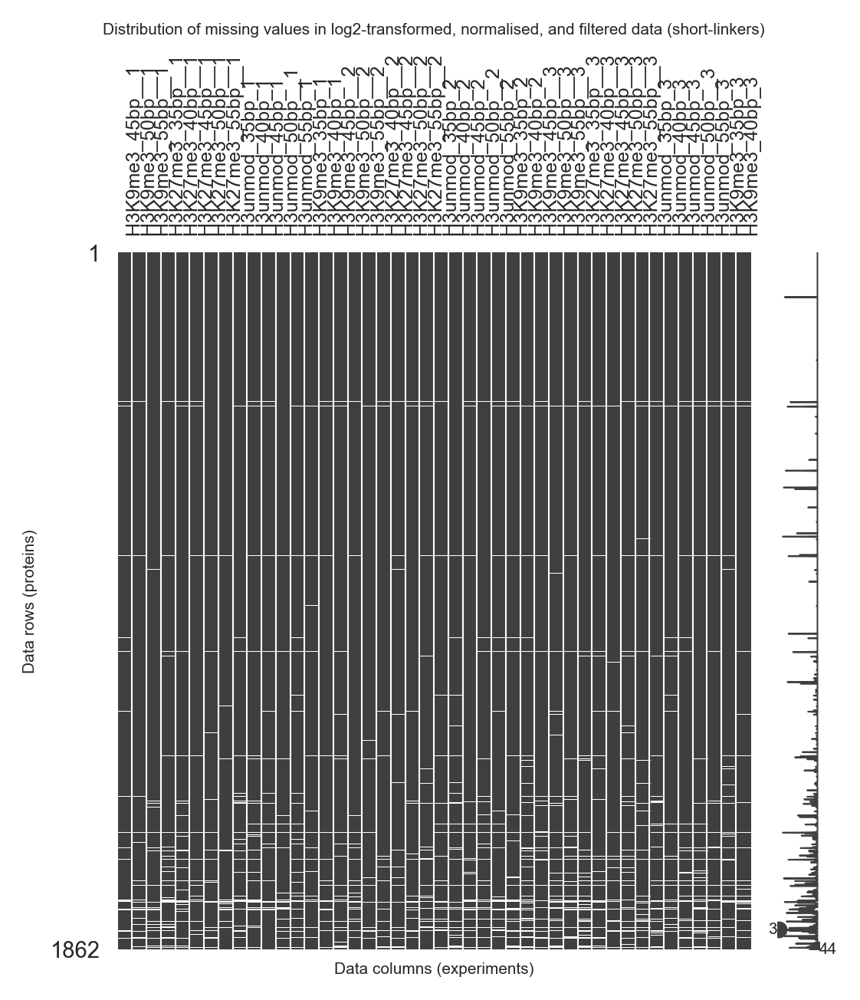

In [81]:
import missingno as msgno
msgno.matrix(data_to_model, figsize=(20*FIVE_MM_IN_INCH, 20*FIVE_MM_IN_INCH), fontsize=6)

plt.title(f"Distribution of missing values in log2-transformed, normalised, and filtered data ({DATASET})")
plt.xlabel("Data columns (experiments)")
plt.ylabel("Data rows (proteins)")
plt.xticks(rotation=90)

_fname = OUTPUT_DIRECTORY / f'03-modelling-log2-transformed-normalised-filtered-missing-values.{DATASET}.png'
_caption = """
Distribution of missing values in the log2-transformed, normalised, and filtered data which will be used for modelling. 
The heatmap above displays all  929 proteins remaining in the data after filtering in rows, and all experiments in columns. 
Dark values indicate the presence of a value, while white space indicates the absence of one. 
The sparkline on the right hand side counts the number of values per protein, which ranges from zero to 12 in this dataset.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

The special cases here are the proteins which have all zero values in some of the conditions:

In [82]:
all_zero_in_some_condition = (number_non_null_per_condition == 0).any(axis=1)
all_zero_in_some_condition = all_zero_in_some_condition.loc[data_to_model.index]
all_zero_in_some_condition.value_counts()

False    1799
True       63
dtype: int64

These proteins are special cases. To visualise them better let's establish a consistent sort order which is based on which condition is missing

In [83]:
all_zero_in_some_condition_sort_order = number_non_null_per_condition.loc[
    all_zero_in_some_condition[all_zero_in_some_condition].index
].sort_values(by=list(number_non_null_per_condition.columns)).index



Let's plot these special cases


Distribution of missing values in the log2-transformed, normalised, and filtered data of proteins that correspond to "special cases" in the modeling as they have all zero values in at least one of the conditions.
The heatmap above displays all of such proteins, sorted by their missing value pattern. 
Dark values indicate the presence of a value, while white space indicates the absence of one. 
The sparkline on the right hand side counts the number of values per protein, which ranges from zero to 12 in this dataset.



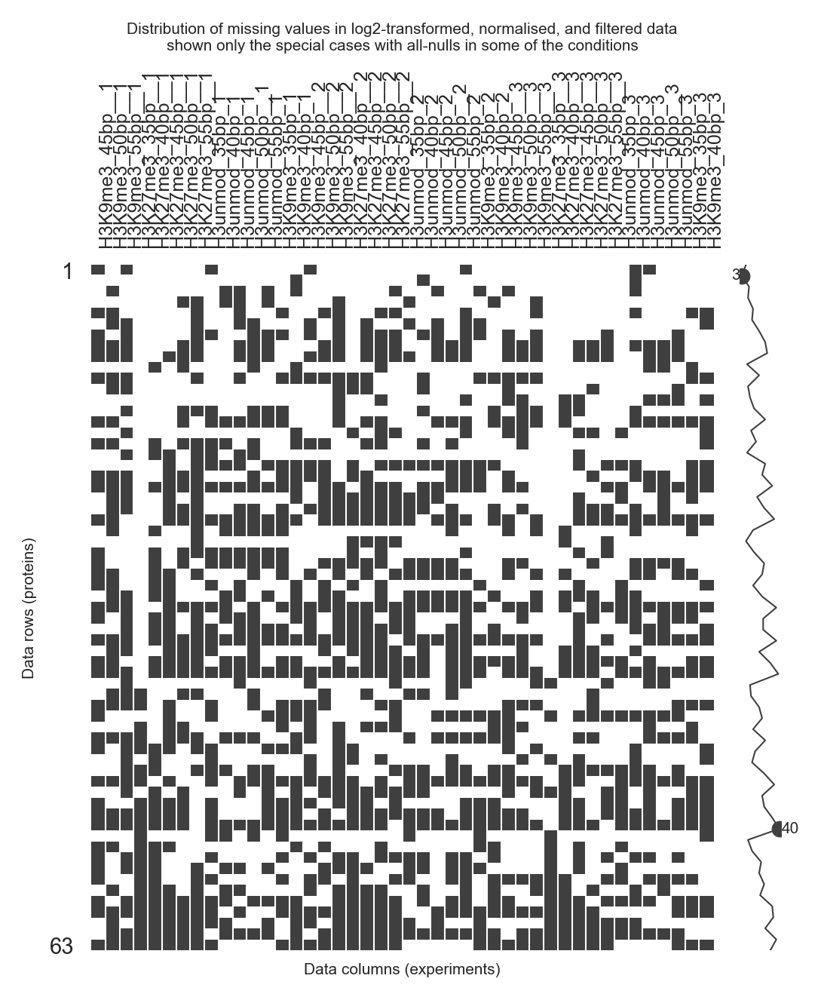

In [84]:
import missingno as msgno
msgno.matrix(
    data_to_model.loc[all_zero_in_some_condition_sort_order], figsize=(20*FIVE_MM_IN_INCH, 20*FIVE_MM_IN_INCH), fontsize=6)

plt.title("Distribution of missing values in log2-transformed, normalised, and filtered data\nshown only the special cases with all-nulls in some of the conditions")
plt.xlabel("Data columns (experiments)")
plt.ylabel("Data rows (proteins)")
plt.xticks(rotation=90)

# For some reason this plot does not rasterize well..
_fname = OUTPUT_DIRECTORY / f'03-modelling-log2-transformed-normalised-filtered-missing-values-all_zero_in_some_condition.{DATASET}.png'
_caption = """
Distribution of missing values in the log2-transformed, normalised, and filtered data of proteins that correspond to "special cases" in the modeling as they have all zero values in at least one of the conditions.
The heatmap above displays all of such proteins, sorted by their missing value pattern. 
Dark values indicate the presence of a value, while white space indicates the absence of one. 
The sparkline on the right hand side counts the number of values per protein, which ranges from zero to 12 in this dataset.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

We can also get a few representative special cases of proteins from that list

In [85]:
import numpy as np

In [86]:
REPRESENTATIVE_NULLS = np.random.RandomState(42).choice(all_zero_in_some_condition_sort_order, 5)

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)



Distribution of non-null values of log2-transformed, normalised, and filtered dataset. 
The rows facet the four experiment types, while the columns split the data per replicate.
The green distribution plot shows the histogram of observed log2 values in the data.
The black curve shows the corresponding normal distribution fit to the data, whose parameters are written in the top-right corner.
The black vertical line indicates the mean ($\mu$) estimate.



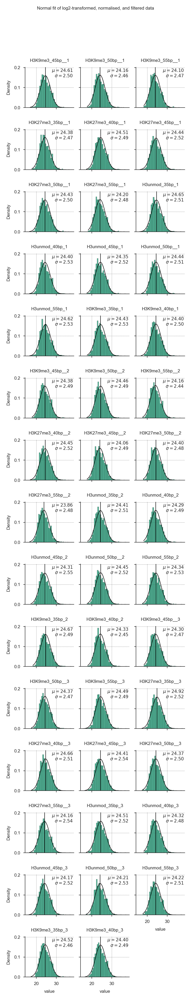

In [87]:
# Convert data to long format
_df = data_to_model.copy()
_df = _df.stack(_df.columns.names)
_df.name = 'value'
_df = _df.reset_index()

# Plot the histograms and normal distribution fits
fgrid = sns.FacetGrid(col='Experiment_Linker_Replicate', col_wrap=3, col_order=data_to_model.columns, data=_df, size=FIVE_MM_IN_INCH*5)
fgrid.map(sns.histplot, 'value', stat='density')
fgrid.map(_plot_norm_fit, 'value')
fgrid.set_titles('{col_name}')

plt.suptitle("Normal fit of log2-transformed, normalised, and filtered data", y=1.05)

_fname = OUTPUT_DIRECTORY / '03-modelling-log2-transformed-normalised-filtered-normal-fit.pdf'
_caption = """
Distribution of non-null values of log2-transformed, normalised, and filtered dataset. 
The rows facet the four experiment types, while the columns split the data per replicate.
The green distribution plot shows the histogram of observed log2 values in the data.
The black curve shows the corresponding normal distribution fit to the data, whose parameters are written in the top-right corner.
The black vertical line indicates the mean ($\mu$) estimate.
"""
plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
with open(str(_fname) + '.caption.md', 'w') as f:
    f.write(_caption)
    print(_caption)

### Design matrix

For modeling we will use limma and encode the data as a "means" model.

We first need to load the limma into rpy2 environment:

In [88]:
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri, numpy2ri

%load_ext rpy2.ipython

Time to load data into R, we will use limma for most tastks:

In [89]:
%%R

library("limma")
packageVersion("limma")

[1] ‘3.50.1’


Now we load the header data and make sure that it's columns are interpreted as factors correctly:

In [90]:
assert headers.index.equals(data_to_model.columns), "Make sure that headers_to_model index matches data_to_model columns!"

In [91]:
headers

,Experiment,Linker,Replicate,Experiment_Linker
Experiment_Linker_Replicate,,,,
H3K9me3_45bp__1,H3K9me3,45bp,1,H3K9me3_45bp
H3K9me3_50bp__1,H3K9me3,50bp,1,H3K9me3_50bp
H3K9me3_55bp__1,H3K9me3,55bp,1,H3K9me3_55bp
H3K27me3_35bp__1,H3K27me3,35bp,1,H3K27me3_35bp
H3K27me3_40bp__1,H3K27me3,40bp,1,H3K27me3_40bp
H3K27me3_45bp__1,H3K27me3,45bp,1,H3K27me3_45bp
H3K27me3_50bp__1,H3K27me3,50bp,1,H3K27me3_50bp
H3K27me3_55bp__1,H3K27me3,55bp,1,H3K27me3_55bp
H3unmod_35bp_1,H3unmod,35bp,1,H3unmod_35bp


In [92]:
%%R -i headers -i DATASET -i ref_experiment -i ref_linker -i ref_experiment_linker

headers$Experiment_Linker <- as.factor(headers$Experiment_Linker)

headers$Experiment_linker <- relevel(headers$Experiment_Linker, ref=ref_experiment_linker)

headers$Experiment <- as.factor(headers$Experiment)
headers$Experiment <- relevel(headers$Experiment, ref=ref_experiment)

headers$Linker <- as.factor(headers$Linker)
headers$Linker <- relevel(headers$Linker, ref=ref_linker)

headers$Replicate <- as.factor(headers$Replicate)
headers

                 Experiment Linker Replicate Experiment_Linker
H3K9me3_45bp__1     H3K9me3   45bp         1      H3K9me3_45bp
H3K9me3_50bp__1     H3K9me3   50bp         1      H3K9me3_50bp
H3K9me3_55bp__1     H3K9me3   55bp         1      H3K9me3_55bp
H3K27me3_35bp__1   H3K27me3   35bp         1     H3K27me3_35bp
H3K27me3_40bp__1   H3K27me3   40bp         1     H3K27me3_40bp
H3K27me3_45bp__1   H3K27me3   45bp         1     H3K27me3_45bp
H3K27me3_50bp__1   H3K27me3   50bp         1     H3K27me3_50bp
H3K27me3_55bp__1   H3K27me3   55bp         1     H3K27me3_55bp
H3unmod_35bp_1      H3unmod   35bp         1      H3unmod_35bp
H3unmod_40bp_1      H3unmod   40bp         1      H3unmod_40bp
H3unmod_45bp_1      H3unmod   45bp         1      H3unmod_45bp
H3unmod_50bp__1     H3unmod   50bp         1      H3unmod_50bp
H3unmod_55bp_1      H3unmod   55bp         1      H3unmod_55bp
H3K9me3_35bp_1      H3K9me3   35bp         1      H3K9me3_35bp
H3K9me3_40bp_1      H3K9me3   40bp         1      H3K9m

To create the design matrix, we will use a Means (no intercept) design

In [93]:
%%R

# Do not use intercept:
design <- model.matrix(~0 + Experiment_Linker, headers)
design

                 Experiment_LinkerH3K27me3_35bp Experiment_LinkerH3K27me3_40bp
H3K9me3_45bp__1                               0                              0
H3K9me3_50bp__1                               0                              0
H3K9me3_55bp__1                               0                              0
H3K27me3_35bp__1                              1                              0
H3K27me3_40bp__1                              0                              1
H3K27me3_45bp__1                              0                              0
H3K27me3_50bp__1                              0                              0
H3K27me3_55bp__1                              0                              0
H3unmod_35bp_1                                0                              0
H3unmod_40bp_1                                0                              0
H3unmod_45bp_1                                0                              0
H3unmod_50bp__1                               0     

From this design matrix we are primarily interested in these (quite a few!) contrasts

In [94]:
sorted(headers['Experiment_Linker'].unique())

['H3K27me3_35bp',
 'H3K27me3_40bp',
 'H3K27me3_45bp',
 'H3K27me3_50bp',
 'H3K27me3_55bp',
 'H3K9me3_35bp',
 'H3K9me3_40bp',
 'H3K9me3_45bp',
 'H3K9me3_50bp',
 'H3K9me3_55bp',
 'H3unmod_35bp',
 'H3unmod_40bp',
 'H3unmod_45bp',
 'H3unmod_50bp',
 'H3unmod_55bp']

In [95]:
%%R -o contrasts_matrix_as_df -i DATASET

if (DATASET == "long-linkers-enh") {
    
    contrasts.matrix <- limma::makeContrasts(

        "modif_H3K27ac_vs_H3unmod_50bp"                = Experiment_LinkerH3K27ac_50bp          - Experiment_LinkerH3unmod_50bp,
        "modif_H3K27ac_vs_H3unmod_200bp_SV40enh"       = Experiment_LinkerH3K27ac_200bp_SV40enh - Experiment_LinkerH3unmod_200bp_SV40enh,
        "modif_H3K27ac_vs_H3unmod_200bp_scr"           = Experiment_LinkerH3K27ac_200bp_scr     - Experiment_LinkerH3unmod_200bp_scr,

        "modif_H3K4me1K27ac_vs_H3unmod_50bp"           = Experiment_LinkerH3K4me1K27ac_50bp          - Experiment_LinkerH3unmod_50bp,
        "modif_H3K4me1K27ac_vs_H3unmod_200bp_SV40enh"  = Experiment_LinkerH3K4me1K27ac_200bp_SV40enh - Experiment_LinkerH3unmod_200bp_SV40enh,
        "modif_H3K4me1K27ac_vs_H3unmod_200bp_scr"      = Experiment_LinkerH3K4me1K27ac_200bp_scr     - Experiment_LinkerH3unmod_200bp_scr,

        "modif_H3K4me1_vs_H3unmod_50bp"                = Experiment_LinkerH3K4me1_50bp          - Experiment_LinkerH3unmod_50bp,
        "modif_H3K4me1_vs_H3unmod_200bp_SV40enh"       = Experiment_LinkerH3K4me1_200bp_SV40enh - Experiment_LinkerH3unmod_200bp_SV40enh,
        "modif_H3K4me1_vs_H3unmod_200bp_scr"           = Experiment_LinkerH3K4me1_200bp_scr     - Experiment_LinkerH3unmod_200bp_scr,
        
        "linker_200bp_scr_vs_50bp_H3K27ac"             = Experiment_LinkerH3K27ac_200bp_scr - Experiment_LinkerH3K27ac_50bp,
        "linker_200bp_scr_vs_50bp_H3K4me1K27ac"        = Experiment_LinkerH3K4me1K27ac_200bp_scr - Experiment_LinkerH3K4me1K27ac_50bp,
        "linker_200bp_scr_vs_50bp_H3K4me1"             = Experiment_LinkerH3K4me1_200bp_scr - Experiment_LinkerH3K4me1_50bp,
        "linker_200bp_scr_vs_50bp_H3unmod"             = Experiment_LinkerH3unmod_200bp_scr - Experiment_LinkerH3unmod_50bp,
        
        "linker_200bp_SV40enh_vs_50bp_H3K27ac"             = Experiment_LinkerH3K27ac_200bp_SV40enh      - Experiment_LinkerH3K27ac_50bp,
        "linker_200bp_SV40enh_vs_50bp_H3K4me1K27ac"        = Experiment_LinkerH3K4me1K27ac_200bp_SV40enh - Experiment_LinkerH3K4me1K27ac_50bp,
        "linker_200bp_SV40enh_vs_50bp_H3K4me1"             = Experiment_LinkerH3K4me1_200bp_SV40enh      - Experiment_LinkerH3K4me1_50bp,
        "linker_200bp_SV40enh_vs_50bp_H3unmod"             = Experiment_LinkerH3unmod_200bp_SV40enh      - Experiment_LinkerH3unmod_50bp,
        
        
        "linker_200bp_SV40enh_vs_200bp_scr_H3K27ac"             = Experiment_LinkerH3K27ac_200bp_SV40enh      - Experiment_LinkerH3K27ac_200bp_scr,
        "linker_200bp_SV40enh_vs_200bp_scr_H3K4me1K27ac"        = Experiment_LinkerH3K4me1K27ac_200bp_SV40enh - Experiment_LinkerH3K4me1K27ac_200bp_scr,
        "linker_200bp_SV40enh_vs_200bp_scr_H3K4me1"             = Experiment_LinkerH3K4me1_200bp_SV40enh      - Experiment_LinkerH3K4me1_200bp_scr,
        "linker_200bp_SV40enh_vs_200bp_scr_H3unmod"             = Experiment_LinkerH3unmod_200bp_SV40enh      - Experiment_LinkerH3unmod_200bp_scr,
        
        levels=design
    )
} else if (DATASET == "long-linkers-prom") {
    
    contrasts.matrix <- limma::makeContrasts(

        "modif_Promoter_PTMs_vs_unmodH3_unmodH4_50bp"                = Experiment_LinkerPromoter_PTMs_50bp           - Experiment_LinkerunmodH3_unmodH4_50bp,
        "modif_Promoter_PTMs_vs_unmodH3_unmodH4_200bp_SV40prom"      = Experiment_LinkerPromoter_PTMs_200bp_SV40prom - Experiment_LinkerunmodH3_unmodH4_200bp_SV40prom,
        "modif_Promoter_PTMs_vs_unmodH3_unmodH4_200bp_scr"           = Experiment_LinkerPromoter_PTMs_200bp_scr      - Experiment_LinkerunmodH3_unmodH4_200bp_scr,
        
        "linker_200bp_scr_vs_50bp_Promoter_PTMs"                     =  Experiment_LinkerPromoter_PTMs_200bp_scr - Experiment_LinkerPromoter_PTMs_50bp,
        "linker_200bp_SV40prom_vs_50bp_Promoter_PTMs"                =  Experiment_LinkerPromoter_PTMs_200bp_SV40prom - Experiment_LinkerPromoter_PTMs_50bp,
        
        "linker_200bp_scr_vs_50bp_unmodH3_unmodH4"                   =  Experiment_LinkerunmodH3_unmodH4_200bp_scr - Experiment_LinkerunmodH3_unmodH4_50bp,
        "linker_200bp_SV40prom_vs_50bp_unmodH3_unmodH4"              =  Experiment_LinkerunmodH3_unmodH4_200bp_SV40prom - Experiment_LinkerunmodH3_unmodH4_50bp,
        
        "linker_200bp_SV40prom_vs_200bp_scr_Promoter_PTMs"           =  Experiment_LinkerPromoter_PTMs_200bp_SV40prom - Experiment_LinkerPromoter_PTMs_200bp_scr,
        "linker_200bp_SV40prom_vs_200bp_scr_unmodH3_unmodH4"         =  Experiment_LinkerunmodH3_unmodH4_200bp_SV40prom - Experiment_LinkerunmodH3_unmodH4_200bp_scr,
       
        levels=design
    )
} else if (DATASET == "short-linkers") {
    contrasts.matrix <- limma::makeContrasts(

        "modif_H3K27me3_vs_H3unmod_35bp"    = Experiment_LinkerH3K27me3_35bp          - Experiment_LinkerH3unmod_35bp,
        "modif_H3K27me3_vs_H3unmod_40bp"    = Experiment_LinkerH3K27me3_40bp          - Experiment_LinkerH3unmod_40bp,
        "modif_H3K27me3_vs_H3unmod_45bp"    = Experiment_LinkerH3K27me3_45bp          - Experiment_LinkerH3unmod_45bp,
        "modif_H3K27me3_vs_H3unmod_50bp"    = Experiment_LinkerH3K27me3_50bp          - Experiment_LinkerH3unmod_50bp,
        "modif_H3K27me3_vs_H3unmod_55bp"    = Experiment_LinkerH3K27me3_55bp          - Experiment_LinkerH3unmod_55bp,
        
        "modif_H3K9me3_vs_H3unmod_35bp"     = Experiment_LinkerH3K9me3_35bp          - Experiment_LinkerH3unmod_35bp,
        "modif_H3K9me3_vs_H3unmod_40bp"     = Experiment_LinkerH3K9me3_40bp          - Experiment_LinkerH3unmod_40bp,
        "modif_H3K9me3_vs_H3unmod_45bp"     = Experiment_LinkerH3K9me3_45bp          - Experiment_LinkerH3unmod_45bp,
        "modif_H3K9me3_vs_H3unmod_50bp"     = Experiment_LinkerH3K9me3_50bp          - Experiment_LinkerH3unmod_50bp,
        "modif_H3K9me3_vs_H3unmod_55bp"     = Experiment_LinkerH3K9me3_55bp          - Experiment_LinkerH3unmod_55bp,
        
        'linker_35bp_vs_50bp_H3K27me3'      =  Experiment_LinkerH3K27me3_35bp - Experiment_LinkerH3K27me3_50bp,
        'linker_40bp_vs_50bp_H3K27me3'      =  Experiment_LinkerH3K27me3_40bp - Experiment_LinkerH3K27me3_50bp,
        'linker_45bp_vs_50bp_H3K27me3'      =  Experiment_LinkerH3K27me3_45bp - Experiment_LinkerH3K27me3_50bp,
        'linker_55bp_vs_50bp_H3K27me3'      =  Experiment_LinkerH3K27me3_55bp - Experiment_LinkerH3K27me3_50bp,
        
        'linker_35bp_vs_50bp_H3K9me3'      =  Experiment_LinkerH3K9me3_35bp - Experiment_LinkerH3K9me3_50bp,
        'linker_40bp_vs_50bp_H3K9me3'      =  Experiment_LinkerH3K9me3_40bp - Experiment_LinkerH3K9me3_50bp,
        'linker_45bp_vs_50bp_H3K9me3'      =  Experiment_LinkerH3K9me3_45bp - Experiment_LinkerH3K9me3_50bp,
        'linker_55bp_vs_50bp_H3K9me3'      =  Experiment_LinkerH3K9me3_55bp - Experiment_LinkerH3K9me3_50bp,
        
        'linker_35bp_vs_50bp_H3unmod'      =  Experiment_LinkerH3unmod_35bp - Experiment_LinkerH3unmod_50bp,
        'linker_40bp_vs_50bp_H3unmod'      =  Experiment_LinkerH3unmod_40bp - Experiment_LinkerH3unmod_50bp,
        'linker_45bp_vs_50bp_H3unmod'      =  Experiment_LinkerH3unmod_45bp - Experiment_LinkerH3unmod_50bp,
        'linker_55bp_vs_50bp_H3unmod'      =  Experiment_LinkerH3unmod_55bp - Experiment_LinkerH3unmod_50bp,
        
        levels=design
    )
}
contrasts_matrix_as_df = as.data.frame(contrasts.matrix)
contrasts.matrix

                                Contrasts
Levels                           modif_H3K27me3_vs_H3unmod_35bp
  Experiment_LinkerH3K27me3_35bp                              1
  Experiment_LinkerH3K27me3_40bp                              0
  Experiment_LinkerH3K27me3_45bp                              0
  Experiment_LinkerH3K27me3_50bp                              0
  Experiment_LinkerH3K27me3_55bp                              0
  Experiment_LinkerH3K9me3_35bp                               0
  Experiment_LinkerH3K9me3_40bp                               0
  Experiment_LinkerH3K9me3_45bp                               0
  Experiment_LinkerH3K9me3_50bp                               0
  Experiment_LinkerH3K9me3_55bp                               0
  Experiment_LinkerH3unmod_35bp                              -1
  Experiment_LinkerH3unmod_40bp                               0
  Experiment_LinkerH3unmod_45bp                               0
  Experiment_LinkerH3unmod_50bp                               

In [96]:
contrasts_matrix_as_df

,modif_H3K27me3_vs_H3unmod_35bp,modif_H3K27me3_vs_H3unmod_40bp,modif_H3K27me3_vs_H3unmod_45bp,modif_H3K27me3_vs_H3unmod_50bp,modif_H3K27me3_vs_H3unmod_55bp,modif_H3K9me3_vs_H3unmod_35bp,modif_H3K9me3_vs_H3unmod_40bp,modif_H3K9me3_vs_H3unmod_45bp,modif_H3K9me3_vs_H3unmod_50bp,modif_H3K9me3_vs_H3unmod_55bp,...,linker_45bp_vs_50bp_H3K27me3,linker_55bp_vs_50bp_H3K27me3,linker_35bp_vs_50bp_H3K9me3,linker_40bp_vs_50bp_H3K9me3,linker_45bp_vs_50bp_H3K9me3,linker_55bp_vs_50bp_H3K9me3,linker_35bp_vs_50bp_H3unmod,linker_40bp_vs_50bp_H3unmod,linker_45bp_vs_50bp_H3unmod,linker_55bp_vs_50bp_H3unmod
Experiment_LinkerH3K27me3_35bp,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Experiment_LinkerH3K27me3_40bp,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Experiment_LinkerH3K27me3_45bp,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Experiment_LinkerH3K27me3_50bp,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Experiment_LinkerH3K27me3_55bp,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Experiment_LinkerH3K9me3_35bp,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Experiment_LinkerH3K9me3_40bp,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
Experiment_LinkerH3K9me3_45bp,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Experiment_LinkerH3K9me3_50bp,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0
Experiment_LinkerH3K9me3_55bp,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


## The fit

Here we fit the simple limma model, and extract the resulting coefficient estimates and contrasts. Note that we use robust=TRUE in the eBayes function

In [97]:
%%R -i data_to_model -o coef_estimates_design -o coef_estimates_contrasts


fit <- limma::lmFit(data_to_model, design)

coef_estimates_design = as.data.frame(fit$coefficients)

fit2 <- limma::contrasts.fit(fit, contrasts.matrix)

# Note robust=TRUE
fit2 <- limma::eBayes(fit2, robust=TRUE)

coef_estimates_contrasts <- as.data.frame(fit2$coefficients)

For coefficient estimates it is now most important to check that the coefficients were estimated in a predictable way for those special case proteins that have all nulls in at least one of the conditions.

In [98]:
_df = number_non_null_per_condition.loc[data_to_model.index]

fraction_null_coefs = []
# For each experiment
for experiment_linker in _df.columns:
    # For each number of non-null values possible
    for non_null_count, _subdf in _df[experiment_linker].groupby(_df[experiment_linker]):
        # Count number of null coefficient_estimates for the coefficient
        fraction_null_coefs.append([
            experiment_linker, 
            non_null_count, 
            coef_estimates_design.loc[_subdf.index, f'Experiment_Linker{experiment_linker}'].isnull().astype(float).mean()])
        
fraction_null_coefs = pd.DataFrame(fraction_null_coefs, columns=['Experiment_Linker',' Number of non-null observations', 'Fraction of null coefficient estimates'])
fraction_null_coefs

,Experiment_Linker,Number of non-null observations,Fraction of null coefficient estimates
0,H3K27me3_35bp,0,1.0
1,H3K27me3_35bp,1,0.0
2,H3K27me3_35bp,2,0.0
3,H3K27me3_40bp,0,1.0
4,H3K27me3_40bp,1,0.0
5,H3K27me3_40bp,2,0.0
6,H3K27me3_40bp,3,0.0
7,H3K27me3_45bp,0,1.0
8,H3K27me3_45bp,1,0.0
9,H3K27me3_45bp,2,0.0


Note that the coefficients are always null when there is zero data for this particular condition (fraction=1) But always non-null otherwise

Below is avisualisation of a few representative proteins:

In [99]:
data_to_model.loc[REPRESENTATIVE_NULLS]

Experiment_Linker_Replicate,H3K9me3_45bp__1,H3K9me3_50bp__1,H3K9me3_55bp__1,H3K27me3_35bp__1,H3K27me3_40bp__1,H3K27me3_45bp__1,H3K27me3_50bp__1,H3K27me3_55bp__1,H3unmod_35bp_1,H3unmod_40bp_1,...,H3K27me3_45bp__3,H3K27me3_50bp__3,H3K27me3_55bp__3,H3unmod_35bp_3,H3unmod_40bp_3,H3unmod_45bp_3,H3unmod_50bp__3,H3unmod_55bp_3,H3K9me3_35bp_3,H3K9me3_40bp_3
Label,,,,,,,,,,,,,,,,,,,,,
COL1A2,NaN,NaN,20.350891,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,20.932941,NaN,NaN,20.417905,19.929546,NaN,NaN,NaN
FANCM,22.210557,21.644418,20.579665,20.295522,20.964239,20.732365,21.402568,NaN,21.433775,21.553925,...,22.257096,21.215241,NaN,21.904796,22.059167,21.744311,21.679602,19.000640,21.048250,22.220014
MRPS7,20.316384,20.375111,NaN,NaN,21.148666,20.672959,NaN,19.464456,NaN,NaN,...,NaN,NaN,NaN,NaN,21.652221,20.516661,NaN,20.988653,20.752430,NaN
PRDM11,20.686292,21.020144,NaN,NaN,NaN,NaN,20.917609,NaN,20.836730,20.764346,...,NaN,NaN,NaN,NaN,21.506240,20.657439,20.954921,21.204990,21.086444,20.650820
HPDL,NaN,NaN,NaN,20.640004,NaN,20.348771,19.514335,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,19.713506,NaN,NaN,19.673132,NaN


In [100]:
coef_estimates_design.loc[REPRESENTATIVE_NULLS]

,Experiment_LinkerH3K27me3_35bp,Experiment_LinkerH3K27me3_40bp,Experiment_LinkerH3K27me3_45bp,Experiment_LinkerH3K27me3_50bp,Experiment_LinkerH3K27me3_55bp,Experiment_LinkerH3K9me3_35bp,Experiment_LinkerH3K9me3_40bp,Experiment_LinkerH3K9me3_45bp,Experiment_LinkerH3K9me3_50bp,Experiment_LinkerH3K9me3_55bp,Experiment_LinkerH3unmod_35bp,Experiment_LinkerH3unmod_40bp,Experiment_LinkerH3unmod_45bp,Experiment_LinkerH3unmod_50bp,Experiment_LinkerH3unmod_55bp
COL1A2,19.279451,NaN,NaN,NaN,21.807915,NaN,NaN,19.069521,NaN,20.797687,NaN,NaN,19.602849,22.034726,21.208189
FANCM,20.295522,20.605854,21.559523,21.329249,NaN,21.032297,22.129743,22.088502,22.005983,20.209936,21.224072,21.845855,21.804325,21.947183,19.311578
MRPS7,NaN,20.795016,20.995002,NaN,20.060112,20.933003,NaN,20.683365,20.375111,21.092691,21.640155,21.090395,20.216328,20.164523,21.245819
PRDM11,NaN,20.803835,20.624018,20.720127,NaN,20.646303,20.890545,20.472036,21.103118,20.207549,20.836730,21.135293,20.948348,20.987406,21.194834
HPDL,20.640004,NaN,20.247055,19.707015,19.712038,19.907946,20.196494,20.062368,20.158839,20.223661,NaN,NaN,19.713506,NaN,NaN


And the corresponding contrasts

In [101]:
coef_estimates_contrasts.loc[REPRESENTATIVE_NULLS]

,modif_H3K27me3_vs_H3unmod_35bp,modif_H3K27me3_vs_H3unmod_40bp,modif_H3K27me3_vs_H3unmod_45bp,modif_H3K27me3_vs_H3unmod_50bp,modif_H3K27me3_vs_H3unmod_55bp,modif_H3K9me3_vs_H3unmod_35bp,modif_H3K9me3_vs_H3unmod_40bp,modif_H3K9me3_vs_H3unmod_45bp,modif_H3K9me3_vs_H3unmod_50bp,modif_H3K9me3_vs_H3unmod_55bp,...,linker_45bp_vs_50bp_H3K27me3,linker_55bp_vs_50bp_H3K27me3,linker_35bp_vs_50bp_H3K9me3,linker_40bp_vs_50bp_H3K9me3,linker_45bp_vs_50bp_H3K9me3,linker_55bp_vs_50bp_H3K9me3,linker_35bp_vs_50bp_H3unmod,linker_40bp_vs_50bp_H3unmod,linker_45bp_vs_50bp_H3unmod,linker_55bp_vs_50bp_H3unmod
COL1A2,NaN,NaN,NaN,NaN,0.599726,NaN,NaN,-0.533328,NaN,-0.410502,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.431877,-0.826538
FANCM,-0.92855,-1.240001,-0.244802,-0.617934,NaN,-0.191775,0.283888,0.284176,0.058800,0.898358,...,0.230274,NaN,-0.973686,0.123760,0.082519,-1.796047,-0.723112,-0.101328,-0.142858,-2.635606
MRPS7,NaN,-0.295379,0.778674,NaN,-1.185708,-0.707152,NaN,0.467037,0.210588,-0.153128,...,NaN,NaN,0.557892,NaN,0.308254,0.717580,1.475631,0.925871,0.051804,1.081296
PRDM11,NaN,-0.331458,-0.324329,-0.267279,NaN,-0.190427,-0.244748,-0.476312,0.115712,-0.987285,...,-0.096109,NaN,-0.456815,-0.212573,-0.631082,-0.895568,-0.150676,0.147887,-0.039058,0.207428
HPDL,NaN,NaN,0.533549,NaN,NaN,NaN,NaN,0.348862,NaN,NaN,...,0.540040,0.005023,-0.250894,0.037655,-0.096471,0.064822,NaN,NaN,NaN,NaN


### Results

The results can be extracted from R by calling the topTable function in limma once for each contrast, and setting number parameter to the number of rows in the data:

In [102]:
%%R -o results_r

coefs <- colnames(contrasts.matrix)
results_r <- list()

for (i in 1:length(coefs)) {
    coef <- coefs[[i]]
    results_r[[coef]] <- limma::topTable(fit2, coef=coef, adjust.method="BH", number=nrow(data_to_model))
}

We convert these results to python and add another column called "Significant" which is true if the adjusted p value is lower than FDR_THRESHOLD specified in parameters

In [103]:
FDR_THRESHOLD

0.05

In [104]:
FC_THRESHOLD

1.0

In [105]:
with robjects.conversion.localconverter(robjects.default_converter + pandas2ri.converter) as co:
    results = {
        k: co.rpy2py(v) for k,v in results_r.items()
    }

for k in results.keys():
    results[k]['significant'] = results[k]['adj.P.Val'] <= FDR_THRESHOLD
    results[k]['significant_with_large_log2fc'] = (results[k]['significant']) & (results[k]['logFC'].abs() >= FC_THRESHOLD) 
results = pd.concat(results, keys=results.keys(), axis=1)
results

modif_H3K27me3_vs_H3unmod_35bp                                         \
                                 logFC          t       P.Value     adj.P.Val   
MTF2                          1.421446  11.103152  1.778172e-12  3.238051e-09   
PHC2                          2.625188  10.618828  5.483624e-12  4.992840e-09   
CBX8                          2.132544   9.730584  4.677742e-11  2.496324e-08   
RMI2                         -2.279017  -9.666387  5.483413e-11  2.496324e-08   
CBX2                          1.734056   9.537929  7.548385e-11  2.749122e-08   
...                                ...        ...           ...           ...   
SMG7                               NaN        NaN           NaN           NaN   
CENPC                              NaN        NaN           NaN           NaN   
SEC23IP                            NaN        NaN           NaN           NaN   
TRIM8                              NaN        NaN           NaN           NaN   
TIAL1                              NaN        NaN           NaN           NaN   

                                                              \
                 B significant significant_with_large_log2fc   
MTF2     18.393072        True                          True   
PHC2     17.313135        True                          True   
CBX8     15.247209        True                          True   
RMI2     15.093575        True                          True   
CBX2     14.784398        True                          True   
...            ...         ...                           ...   
SMG7           NaN       False                         False   
CENPC          NaN       False                         False   
SEC23IP        NaN       False                         False   
TRIM8          NaN       False                         False   
TIAL1          NaN       False                         False   

        modif_H3K27me3_vs_H3unmod_40bp                           ...  \
                                 logFC          t       P.Value  ...   
MTF2                          1.111065   9.703096  5.006778e-11  ...   
PHC2                          3.142099  14.209898  2.509377e-15  ...   
CBX8                          2.709946  13.824727  5.344244e-15  ...   
RMI2                         -1.215355  -5.763346  2.199915e-06  ...   
CBX2                          1.392021   8.560352  9.223756e-10  ...   
...                                ...        ...           ...  ...   
SMG7                          1.258252   1.460944  1.684629e-01  ...   
CENPC                         0.650955   1.005901  3.297850e-01  ...   
SEC23IP                      -0.633204  -0.755743  4.662240e-01  ...   
TRIM8                        -0.056090  -0.042314  9.666040e-01  ...   
TIAL1                              NaN        NaN           NaN  ...   

        linker_45bp_vs_50bp_H3unmod                                            \
                                  B significant significant_with_large_log2fc   
MTF2                      -3.671550       False                         False   
PHC2                      -3.370556       False                         False   
CBX8                      -5.539091       False                         False   
RMI2                      -4.709836       False                         False   
CBX2                      -5.448713       False                         False   
...                             ...         ...                           ...   
SMG7                      -5.010777       False                         False   
CENPC                     -5.005606       False                         False   
SEC23IP                   -4.507942       False                         False   
TRIM8                     -5.545809       False                         False   
TIAL1                           NaN       False                         False   

        linker_55bp_vs_50bp_H3unmod                                        \
                              logFC         t       P

In [106]:
assert set(results.index) == set(data_to_model.index), "Results index does not match input index"

In [107]:
results.loc(axis=1)[:, 'significant'].sum()

modif_H3K27me3_vs_H3unmod_35bp  significant    49
modif_H3K27me3_vs_H3unmod_40bp  significant    43
modif_H3K27me3_vs_H3unmod_45bp  significant    37
modif_H3K27me3_vs_H3unmod_50bp  significant    30
modif_H3K27me3_vs_H3unmod_55bp  significant    33
modif_H3K9me3_vs_H3unmod_35bp   significant    14
modif_H3K9me3_vs_H3unmod_40bp   significant    16
modif_H3K9me3_vs_H3unmod_45bp   significant    23
modif_H3K9me3_vs_H3unmod_50bp   significant    21
modif_H3K9me3_vs_H3unmod_55bp   significant    14
linker_35bp_vs_50bp_H3K27me3    significant    53
linker_40bp_vs_50bp_H3K27me3    significant    10
linker_45bp_vs_50bp_H3K27me3    significant     0
linker_55bp_vs_50bp_H3K27me3    significant    23
linker_35bp_vs_50bp_H3K9me3     significant    38
linker_40bp_vs_50bp_H3K9me3     significant     9
linker_45bp_vs_50bp_H3K9me3     significant     0
linker_55bp_vs_50bp_H3K9me3     significant    23
linker_35bp_vs_50bp_H3unmod     significant    13
linker_40bp_vs_50bp_H3unmod     significant    11


In [108]:
results.loc(axis=1)[:, 'significant_with_large_log2fc'].sum()

modif_H3K27me3_vs_H3unmod_35bp  significant_with_large_log2fc    32
modif_H3K27me3_vs_H3unmod_40bp  significant_with_large_log2fc    23
modif_H3K27me3_vs_H3unmod_45bp  significant_with_large_log2fc    22
modif_H3K27me3_vs_H3unmod_50bp  significant_with_large_log2fc    17
modif_H3K27me3_vs_H3unmod_55bp  significant_with_large_log2fc    19
modif_H3K9me3_vs_H3unmod_35bp   significant_with_large_log2fc    11
modif_H3K9me3_vs_H3unmod_40bp   significant_with_large_log2fc    12
modif_H3K9me3_vs_H3unmod_45bp   significant_with_large_log2fc    17
modif_H3K9me3_vs_H3unmod_50bp   significant_with_large_log2fc    14
modif_H3K9me3_vs_H3unmod_55bp   significant_with_large_log2fc    13
linker_35bp_vs_50bp_H3K27me3    significant_with_large_log2fc    34
linker_40bp_vs_50bp_H3K27me3    significant_with_large_log2fc     9
linker_45bp_vs_50bp_H3K27me3    significant_with_large_log2fc     0
linker_55bp_vs_50bp_H3K27me3    significant_with_large_log2fc    18
linker_35bp_vs_50bp_H3K9me3     significant_with

In [109]:
results.loc(axis=1)[:, 'significant'].sum()

modif_H3K27me3_vs_H3unmod_35bp  significant    49
modif_H3K27me3_vs_H3unmod_40bp  significant    43
modif_H3K27me3_vs_H3unmod_45bp  significant    37
modif_H3K27me3_vs_H3unmod_50bp  significant    30
modif_H3K27me3_vs_H3unmod_55bp  significant    33
modif_H3K9me3_vs_H3unmod_35bp   significant    14
modif_H3K9me3_vs_H3unmod_40bp   significant    16
modif_H3K9me3_vs_H3unmod_45bp   significant    23
modif_H3K9me3_vs_H3unmod_50bp   significant    21
modif_H3K9me3_vs_H3unmod_55bp   significant    14
linker_35bp_vs_50bp_H3K27me3    significant    53
linker_40bp_vs_50bp_H3K27me3    significant    10
linker_45bp_vs_50bp_H3K27me3    significant     0
linker_55bp_vs_50bp_H3K27me3    significant    23
linker_35bp_vs_50bp_H3K9me3     significant    38
linker_40bp_vs_50bp_H3K9me3     significant     9
linker_45bp_vs_50bp_H3K9me3     significant     0
linker_55bp_vs_50bp_H3K9me3     significant    23
linker_35bp_vs_50bp_H3unmod     significant    13
linker_40bp_vs_50bp_H3unmod     significant    11


### Sanity checks

Intuitive interpretation of contrasts

We now check these results to see that the estimated log fold changes (by limma) are close to what we would expect from naive modelling.


This is needed both as a sanity check, and as a justification for "fold change imputation" for a few cases where the FCs could not be estimated analytically.

In [110]:
def data_to_model_by_experiment_label(experiment_linker):
    cols = headers[headers['Experiment_Linker'] == experiment_linker].index
    return data_to_model[list(cols)]

In [111]:
naive_links = {}

# If you edit this, remember to edit plots in notebook  04 too
if DATASET == 'long-linkers-enh':
    
    for experiment in ['H3K4me1', 'H3K27ac', 'H3K4me1K27ac']:
        for linker in ['50bp', '200bp_scr', '200bp_SV40enh']:
            naive_links[f'modif_{experiment}_vs_H3unmod_{linker}'] = f'{experiment}_{linker}', f'{ref_experiment}_{linker}'
        
    for linker in ['200bp_scr', '200bp_SV40enh']:
        for experiment in ['H3K4me1', 'H3K27ac', 'H3K4me1K27ac', 'H3unmod']:
            naive_links[f'linker_{linker}_vs_{ref_linker}_{experiment}'] = f'{experiment}_{linker}', f'{experiment}_{ref_linker}'
     
    for linker in ['200bp_SV40enh']:
        for experiment in ['H3K4me1', 'H3K27ac', 'H3K4me1K27ac', 'H3unmod']:
            naive_links[f'linker_{linker}_vs_200bp_scr_{experiment}'] = f'{experiment}_{linker}', f'{experiment}_200bp_scr'
    
if DATASET == 'long-linkers-prom':
    for experiment in ['Promoter_PTMs']:
        for linker in ['50bp', '200bp_scr', '200bp_SV40prom']:
            naive_links[f'modif_{experiment}_vs_{ref_experiment}_{linker}'] = f'{experiment}_{linker}', f'{ref_experiment}_{linker}'
    
    for linker in ['200bp_scr', '200bp_SV40prom']:
        for experiment in ['Promoter_PTMs', 'unmodH3_unmodH4']:
            naive_links[f'linker_{linker}_vs_{ref_linker}_{experiment}'] = f'{experiment}_{linker}', f'{experiment}_{ref_linker}'
    
    for linker in ['200bp_SV40prom']:
        for experiment in ['Promoter_PTMs', 'unmodH3_unmodH4']:
            naive_links[f'linker_{linker}_vs_200bp_scr_{experiment}'] = f'{experiment}_{linker}', f'{experiment}_200bp_scr'
     
    
elif DATASET == 'short-linkers':
    
    for experiment in ['H3K27me3', 'H3K9me3']:
        for linker in ['35bp', '40bp', '45bp', '50bp', '55bp']:
            naive_links[f'modif_{experiment}_vs_H3unmod_{linker}'] = f'{experiment}_{linker}', f'H3unmod_{linker}'
        
    
    for linker in ['35bp', '40bp', '45bp', '55bp']:
        for experiment in ['H3K27me3', 'H3K9me3', 'H3unmod']:
            naive_links[f'linker_{linker}_vs_50bp_{experiment}'] = f'{experiment}_{linker}', f'{experiment}_50bp'
        

expected_naively = {k: data_to_model_by_experiment_label(treat).mean(axis=1) - data_to_model_by_experiment_label(control).mean(axis=1) for k, (treat, control) in naive_links.items()}
        

In [112]:
import pingouin as pg


    Comparison of the modif_H3K27me3_vs_H3unmod_35bp coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    

    Comparison of the modif_H3K27me3_vs_H3unmod_40bp coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a l

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.1, the latest is 0.2.2.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.1, the latest is 0.5.2.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(



    Comparison of the linker_35bp_vs_50bp_H3K27me3 coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    

    Comparison of the linker_35bp_vs_50bp_H3K9me3 coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear

/var/folders/l5/c9g36v3d2sq081c_mw1ts558cnj5wc/T/ipykernel_14182/1796864390.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()



    Comparison of the linker_55bp_vs_50bp_H3K9me3 coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    

    Comparison of the linker_55bp_vs_50bp_H3unmod coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear 

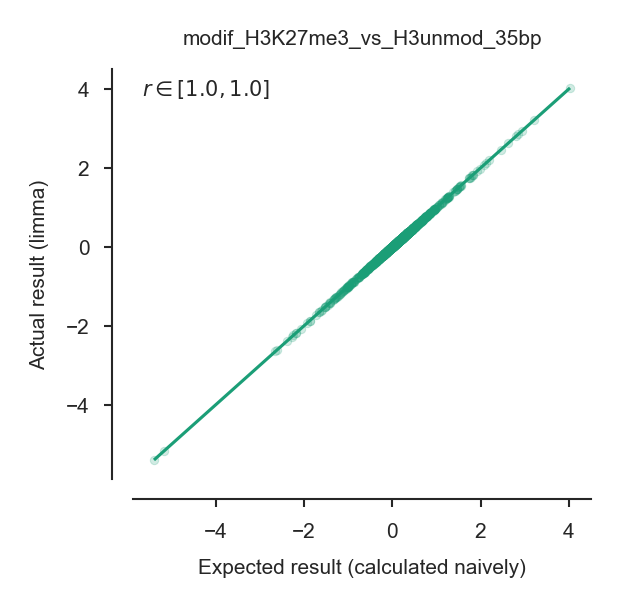

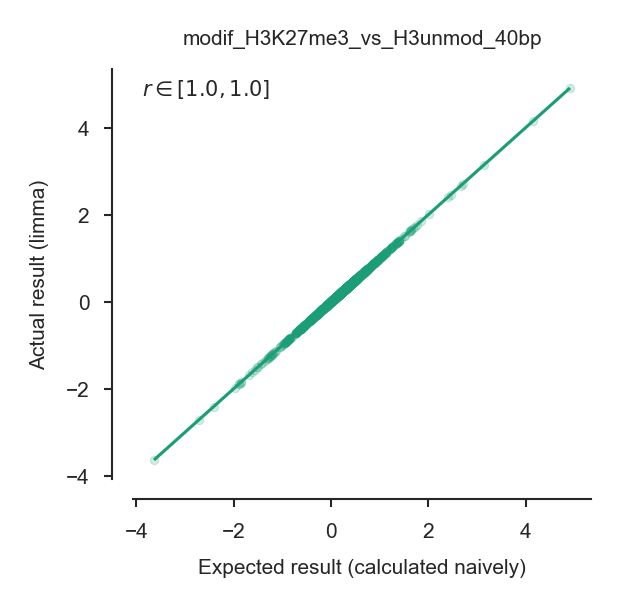

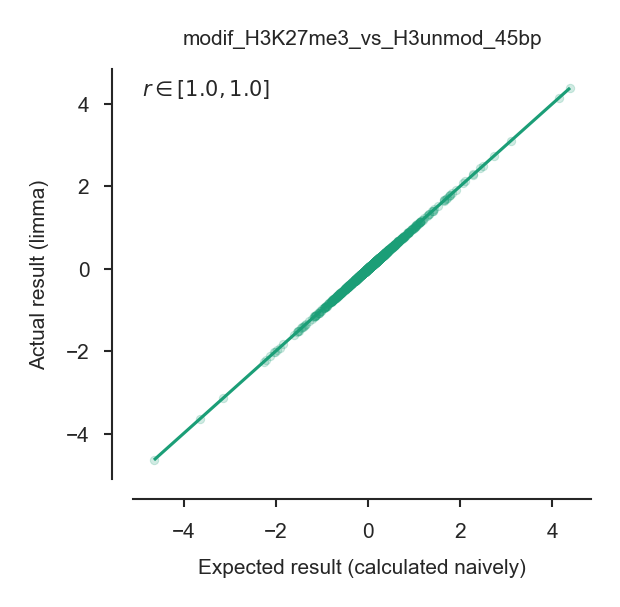

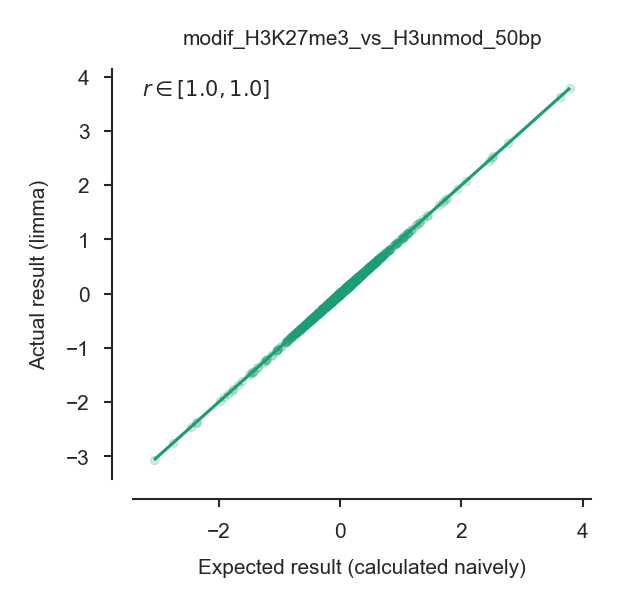

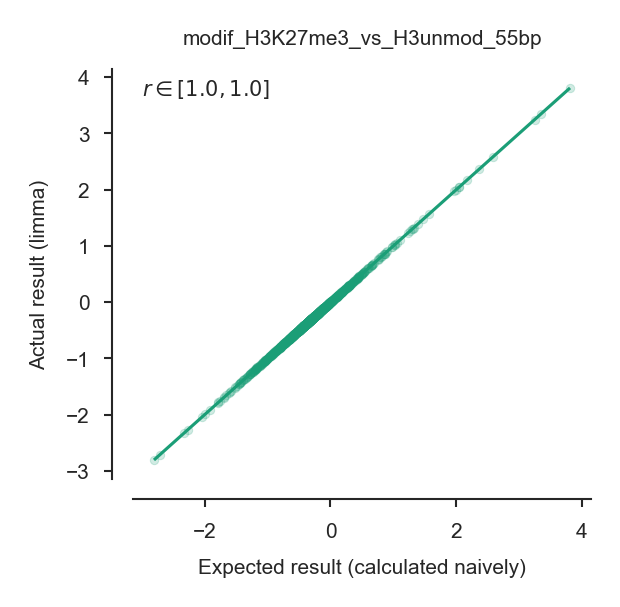

...

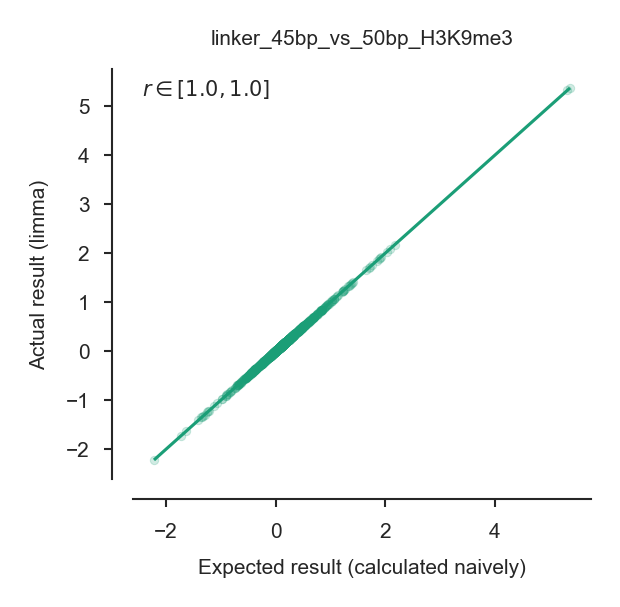

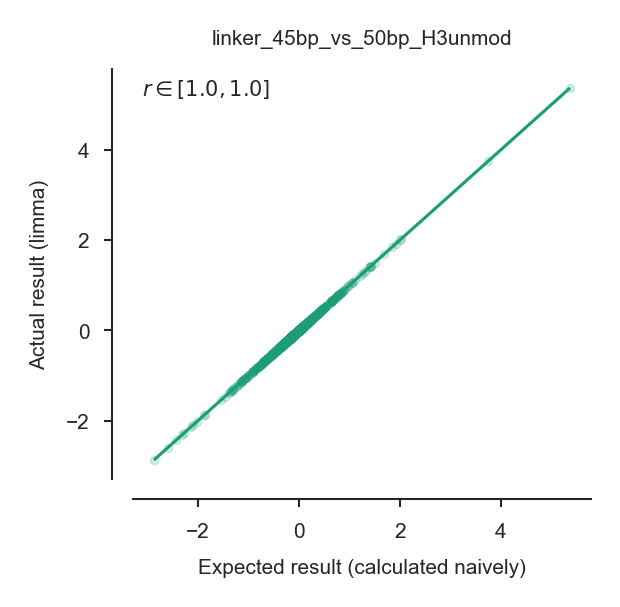

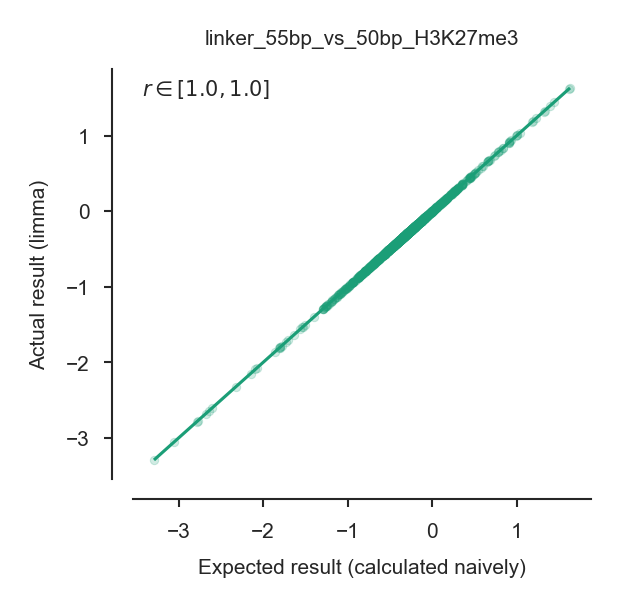

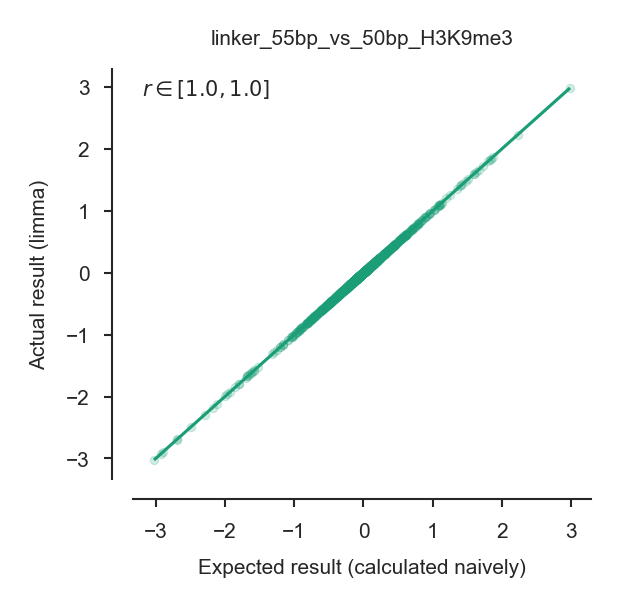

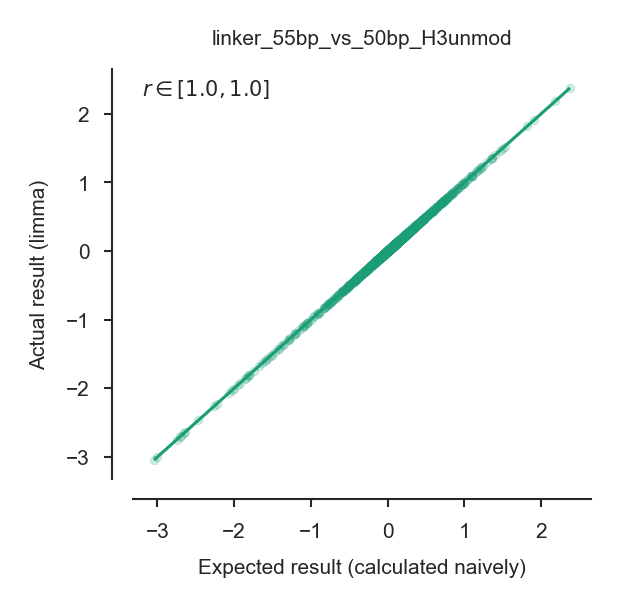

In [113]:
for column, expectation in expected_naively.items():
    fig = plt.figure()
    ax = plt.gca()
    
    _df = pd.DataFrame({'expectation': expectation, 'actual': results[column, 'logFC']})
    
    correlation = pg.corr(_df['expectation'], _df['actual'], method='pearson')
    assert np.abs(correlation.loc['pearson', 'r'] - 1) < 1e-6, '{}: Correlation should be perfect, got: {}'.format(column, correlation.loc['pearson', 'r']) # This should always be one
    correlation = correlation.loc['pearson', 'CI95%']
    
    sns.regplot(x='expectation', y='actual', scatter_kws=dict(alpha=0.2), data=_df)
    
    ax.text(0.02, 0.98, r'$r \in [{}, {}]$'.format(*correlation), transform=ax.transAxes, ha='left', va='top')
    ax.set_xlabel("Expected result (calculated naively)")
    ax.set_ylabel("Actual result (limma)")
    ax.set_title(column)
    sns.despine(ax=ax, offset=5)
    
    ax.grid(False)
    
    _fname = OUTPUT_DIRECTORY / f'04-modelling-sanity-checks-for-coefficient-interpretation-{column}.pdf'
    _caption = f"""
    Comparison of the {column} coefficient estimates computed by the model (y axis), and their expected values (x axis).
    The expected values were computed naively - by subtracting the coresponding means from each other.
    The actual values were computed using the limma statistical model.
    
    The scatterpoint highlight individual protein estimates, the line is a linear regression estimate.
    The 95% confidence interval for pearson R estimate is written in the top left corner.
    
    If the model is working correctly, we would expect a perfect fit here.
    """
    plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
    with open(str(_fname) + '.caption.md', 'w') as f:
        f.write(_caption)
        print(_caption)
    

In [114]:
results.swaplevel(axis=1)['significant'].sum()

modif_H3K27me3_vs_H3unmod_35bp    49
modif_H3K27me3_vs_H3unmod_40bp    43
modif_H3K27me3_vs_H3unmod_45bp    37
modif_H3K27me3_vs_H3unmod_50bp    30
modif_H3K27me3_vs_H3unmod_55bp    33
modif_H3K9me3_vs_H3unmod_35bp     14
modif_H3K9me3_vs_H3unmod_40bp     16
modif_H3K9me3_vs_H3unmod_45bp     23
modif_H3K9me3_vs_H3unmod_50bp     21
modif_H3K9me3_vs_H3unmod_55bp     14
linker_35bp_vs_50bp_H3K27me3      53
linker_40bp_vs_50bp_H3K27me3      10
linker_45bp_vs_50bp_H3K27me3       0
linker_55bp_vs_50bp_H3K27me3      23
linker_35bp_vs_50bp_H3K9me3       38
linker_40bp_vs_50bp_H3K9me3        9
linker_45bp_vs_50bp_H3K9me3        0
linker_55bp_vs_50bp_H3K9me3       23
linker_35bp_vs_50bp_H3unmod       13
linker_40bp_vs_50bp_H3unmod       11
linker_45bp_vs_50bp_H3unmod        1
linker_55bp_vs_50bp_H3unmod       18
dtype: int64

### Imputation

Imputation of results

While the model behaves correctly for most proteins, we want to:

1. flag the following result estimates:
    - estimates which are based only on one data point
    - imputed estimates (see below)
2. impute certain fold change estimates, namely:
    - mark proteins detected in treatments, but not detected in both controls as "infinitely enriched" (logFC=+inf)
    - mark proteins detected in both controls, but not in treatmets as "infinitely excluded" (logFC=-inf)
    - in cases where logFC could not be estimated because one (but not both!) controls are missing, calculate the logFC only from the control that is detected.

In [115]:
def flag_and_or_impute(estimate, treatments, controls):
    
    # Count number of datapoints for treatment and control
    number_non_null_treatments = (~treatments.isnull()).sum(axis=1)
    number_non_null_controls = (~controls.isnull()).sum(axis=1)
    
    # First check if our estimate is based on a single datapoint
    # This is true if treatments have only one non-null value
                                                            
    based_on_single_datapoint = number_non_null_treatments == 1
    # Or the controls have only one non-null value
    based_on_single_datapoint |= number_non_null_controls == 1
    
    # Now let's see if we need to impute some of the estimates
    
    
    # Start with copying the estimates
    imputed_estimate = estimate.copy()
    
    # Find datapoints w/o estimates
    no_estimate = estimate.isnull()
    
    # Impute positive infinities
    imputed_estimate.loc[
        # Where we have no estimate, but treatment data and no control data
        no_estimate & (number_non_null_treatments > 0)  & (number_non_null_controls == 0),
    ] = np.inf
    
    # Impute negative infinities
    imputed_estimate.loc[
        # Where we have no estimate, no treatment data but some control data
        no_estimate & (number_non_null_treatments == 0)  & (number_non_null_controls > 0),
    ] = -np.inf
    
    # Impute estimates where we have some treatment and control data, but still no estimate
    # (this happens when only one of the controls give a value, for instance)
    imputable_entries = no_estimate & (number_non_null_treatments > 0)  & (number_non_null_controls > 0)
    
    # Here we are using the results from the "sanity checks above" - that the mean estimates are
    # the same as model estimates..
    imputed_estimate.loc[
        imputable_entries,
    ] = treatments.loc[imputable_entries].mean(axis=1) - controls.loc[imputable_entries].mean(axis=1)
    
    
    # We can get the list of imputed estimates by comparing the null estimates between the imputed and (real) column:
    
    is_imputed = (~imputed_estimate.isnull()) & (no_estimate)
    
    # assert that for all non-null estimates imputed estimate is the same (i.e. that we didn't override)
    assert_array_equal(imputed_estimate.loc[~no_estimate], estimate.loc[~no_estimate])
    
    
    return pd.DataFrame({
        'logFC_imputed': imputed_estimate,
        'logFC_is_imputed': is_imputed,
        'logFC_based_on_single_datapoint': based_on_single_datapoint, 
    })

In [116]:
results_flags_and_imputations = {}

for contrast, (treat, control) in naive_links.items():
    results_flags_and_imputations[contrast] = flag_and_or_impute(
        results[contrast, 'logFC'], 
        data_to_model_by_experiment_label(treat),
        data_to_model_by_experiment_label(control),
    )
    
results_flags_and_imputations = pd.concat(results_flags_and_imputations, axis=1)
results_flags_and_imputations

modif_H3K27me3_vs_H3unmod_35bp                   \
                         logFC_imputed logFC_is_imputed   
A6NP81                       -0.087585            False   
AATF                          0.864111            False   
ABCC1                        -1.407124            False   
ABCD3                        -0.998809            False   
ABCF1                         0.718127            False   
...                                ...              ...   
ZNF644                       -0.902379            False   
ZNF740                        0.251624            False   
ZNF768                        0.405177            False   
ZRANB2                        0.213143            False   
ZSCAN29                      -0.105117            False   

                                        modif_H3K27me3_vs_H3unmod_40bp  \
        logFC_based_on_single_datapoint                  logFC_imputed   
A6NP81                            False                       0.278837   
AATF                              False                       0.681011   
ABCC1                             False                      -0.098051   
ABCD3                              True                      -0.584732   
ABCF1                             False                       1.056471   
...                                 ...                            ...   
ZNF644                            False                      -0.940802   
ZNF740                            False                       0.157647   
ZNF768                            False                      -0.005283   
ZRANB2                            False                       0.571231   
ZSCAN29                           False                      -0.368794   

                                                          \
        logFC_is_imputed logFC_based_on_single_datapoint   
A6NP81             False                           False   
AATF               False                           False   
ABCC1              False                           False   
ABCD3              False                           False   
ABCF1              False                           False   
...                  ...                             ...   
ZNF644             False                           False   
ZNF740             False                           False   
ZNF768             False                           False   
ZRANB2             False                           False   
ZSCAN29            False                           False   

        modif_H3K27me3_vs_H3unmod_45bp                   \
                         logFC_imputed logFC_is_imputed   
A6NP81                        0.206190            False   
AATF                         -0.406274            False   
ABCC1                        -0.171202            False   
ABCD3                        -0.652215            False   
ABCF1                         0.421175            False   
...                                ...              ...   
ZNF644                       -0.199000            False   
ZNF740                       -0.021003            False   
ZNF768                       -0.149118            False   
ZRANB2                       -0.074663            False   
ZSCAN29                       0.311158            False   

                                        modif_H3K27me3_vs_H3unmod_50bp  ...  \
        logFC_based_on_single_datapoint                  logFC_imputed  ...   
A6NP81                            False                      -0.157302  ...   
AATF                              False                       0.454291  ...   
ABCC1                             False                       0.488559  ...   
ABCD3                             False                      -0.602778  ...   
ABCF1                              True                       0.230377  ...   
...                                 ...                            ...  ...   
ZNF644                            False                      -1.223519  ...   
ZNF740           

In [117]:
for contrast in naive_links:
    n_imputed = results_flags_and_imputations[contrast, 'logFC_is_imputed'].sum()
    print(f'{contrast}: number imputed: {n_imputed}')

modif_H3K27me3_vs_H3unmod_35bp: number imputed: 30
modif_H3K27me3_vs_H3unmod_40bp: number imputed: 22
modif_H3K27me3_vs_H3unmod_45bp: number imputed: 20
modif_H3K27me3_vs_H3unmod_50bp: number imputed: 21
modif_H3K27me3_vs_H3unmod_55bp: number imputed: 16
modif_H3K9me3_vs_H3unmod_35bp: number imputed: 18
modif_H3K9me3_vs_H3unmod_40bp: number imputed: 23
modif_H3K9me3_vs_H3unmod_45bp: number imputed: 14
modif_H3K9me3_vs_H3unmod_50bp: number imputed: 23
modif_H3K9me3_vs_H3unmod_55bp: number imputed: 11
linker_35bp_vs_50bp_H3K27me3: number imputed: 35
linker_35bp_vs_50bp_H3K9me3: number imputed: 21
linker_35bp_vs_50bp_H3unmod: number imputed: 18
linker_40bp_vs_50bp_H3K27me3: number imputed: 17
linker_40bp_vs_50bp_H3K9me3: number imputed: 20
linker_40bp_vs_50bp_H3unmod: number imputed: 20
linker_45bp_vs_50bp_H3K27me3: number imputed: 9
linker_45bp_vs_50bp_H3K9me3: number imputed: 17
linker_45bp_vs_50bp_H3unmod: number imputed: 18
linker_55bp_vs_50bp_H3K27me3: number imputed: 21
linker_55bp_

Add data comment columns

In [118]:
def comment_string(flags, column):
    
    if flags['logFC_is_imputed'] and flags['logFC_based_on_single_datapoint']:
        return f'logFC({column}) estimation failed and was imputed based on a single datapoint only'
    elif flags['logFC_is_imputed']:
        return f'logFC({column}) estimation failed and was imputed'
    elif flags['logFC_based_on_single_datapoint']:
        return f'logFC({column}) estimation was based on a single datapoint only'
    elif pd.isnull(flags['logFC_imputed']):
        return f'logFC({column}) estimation failed'
    

In [119]:
contrasts_matrix_as_df.columns

Index(['modif_H3K27me3_vs_H3unmod_35bp', 'modif_H3K27me3_vs_H3unmod_40bp',
       'modif_H3K27me3_vs_H3unmod_45bp', 'modif_H3K27me3_vs_H3unmod_50bp',
       'modif_H3K27me3_vs_H3unmod_55bp', 'modif_H3K9me3_vs_H3unmod_35bp',
       'modif_H3K9me3_vs_H3unmod_40bp', 'modif_H3K9me3_vs_H3unmod_45bp',
       'modif_H3K9me3_vs_H3unmod_50bp', 'modif_H3K9me3_vs_H3unmod_55bp',
       'linker_35bp_vs_50bp_H3K27me3', 'linker_40bp_vs_50bp_H3K27me3',
       'linker_45bp_vs_50bp_H3K27me3', 'linker_55bp_vs_50bp_H3K27me3',
       'linker_35bp_vs_50bp_H3K9me3', 'linker_40bp_vs_50bp_H3K9me3',
       'linker_45bp_vs_50bp_H3K9me3', 'linker_55bp_vs_50bp_H3K9me3',
       'linker_35bp_vs_50bp_H3unmod', 'linker_40bp_vs_50bp_H3unmod',
       'linker_45bp_vs_50bp_H3unmod', 'linker_55bp_vs_50bp_H3unmod'],
      dtype='object')

In [120]:
comments_results_flags = {
    col: results_flags_and_imputations[col].apply(comment_string, column=col, axis=1) for col in contrasts_matrix_as_df.columns
}

Let's check the imputation results for the representative null proteins below, a reminder of what the data to model for these proteins looks like:

In [121]:
data_to_model.loc[REPRESENTATIVE_NULLS]

Experiment_Linker_Replicate,H3K9me3_45bp__1,H3K9me3_50bp__1,H3K9me3_55bp__1,H3K27me3_35bp__1,H3K27me3_40bp__1,H3K27me3_45bp__1,H3K27me3_50bp__1,H3K27me3_55bp__1,H3unmod_35bp_1,H3unmod_40bp_1,...,H3K27me3_45bp__3,H3K27me3_50bp__3,H3K27me3_55bp__3,H3unmod_35bp_3,H3unmod_40bp_3,H3unmod_45bp_3,H3unmod_50bp__3,H3unmod_55bp_3,H3K9me3_35bp_3,H3K9me3_40bp_3
Label,,,,,,,,,,,,,,,,,,,,,
COL1A2,NaN,NaN,20.350891,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,20.932941,NaN,NaN,20.417905,19.929546,NaN,NaN,NaN
FANCM,22.210557,21.644418,20.579665,20.295522,20.964239,20.732365,21.402568,NaN,21.433775,21.553925,...,22.257096,21.215241,NaN,21.904796,22.059167,21.744311,21.679602,19.000640,21.048250,22.220014
MRPS7,20.316384,20.375111,NaN,NaN,21.148666,20.672959,NaN,19.464456,NaN,NaN,...,NaN,NaN,NaN,NaN,21.652221,20.516661,NaN,20.988653,20.752430,NaN
PRDM11,20.686292,21.020144,NaN,NaN,NaN,NaN,20.917609,NaN,20.836730,20.764346,...,NaN,NaN,NaN,NaN,21.506240,20.657439,20.954921,21.204990,21.086444,20.650820
HPDL,NaN,NaN,NaN,20.640004,NaN,20.348771,19.514335,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,19.713506,NaN,NaN,19.673132,NaN


The corresponding mean estimates for the coefficients minus simple mean of controls (for comparison) where approrpiate

In [122]:
results_flags_and_imputations.loc[REPRESENTATIVE_NULLS].loc(axis=1)[:, 'logFC_imputed']

,modif_H3K27me3_vs_H3unmod_35bp,modif_H3K27me3_vs_H3unmod_40bp,modif_H3K27me3_vs_H3unmod_45bp,modif_H3K27me3_vs_H3unmod_50bp,modif_H3K27me3_vs_H3unmod_55bp,modif_H3K9me3_vs_H3unmod_35bp,modif_H3K9me3_vs_H3unmod_40bp,modif_H3K9me3_vs_H3unmod_45bp,modif_H3K9me3_vs_H3unmod_50bp,modif_H3K9me3_vs_H3unmod_55bp,...,linker_35bp_vs_50bp_H3unmod,linker_40bp_vs_50bp_H3K27me3,linker_40bp_vs_50bp_H3K9me3,linker_40bp_vs_50bp_H3unmod,linker_45bp_vs_50bp_H3K27me3,linker_45bp_vs_50bp_H3K9me3,linker_45bp_vs_50bp_H3unmod,linker_55bp_vs_50bp_H3K27me3,linker_55bp_vs_50bp_H3K9me3,linker_55bp_vs_50bp_H3unmod
,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,...,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed,logFC_imputed
COL1A2,inf,NaN,-inf,-inf,0.599726,NaN,NaN,-0.533328,-inf,-0.410502,...,-inf,NaN,NaN,-inf,NaN,inf,-2.431877,inf,inf,-0.826538
FANCM,-0.92855,-1.240001,-0.244802,-0.617934,-inf,-0.191775,0.283888,0.284176,0.058800,0.898358,...,-0.723112,-0.723395,0.123760,-0.101328,0.230274,0.082519,-0.142858,-inf,-1.796047,-2.635606
MRPS7,-inf,-0.295379,0.778674,-inf,-1.185708,-0.707152,-inf,0.467037,0.210588,-0.153128,...,1.475631,inf,-inf,0.925871,inf,0.308254,0.051804,inf,0.717580,1.081296
PRDM11,-inf,-0.331458,-0.324329,-0.267279,-inf,-0.190427,-0.244748,-0.476312,0.115712,-0.987285,...,-0.150676,0.083708,-0.212573,0.147887,-0.096109,-0.631082,-0.039058,-inf,-0.895568,0.207428
HPDL,inf,NaN,0.533549,inf,inf,inf,inf,0.348862,inf,inf,...,NaN,-inf,0.037655,NaN,0.540040,-0.096471,inf,0.005023,0.064822,NaN



## Output


At this point this notebook is finished, so it's time to collect the results and visualise

Let's start with a combined "comment column", which joins the filtering comment and the flag comments

In [123]:
full_comments = pd.DataFrame({'filter_comment': data_comment, 'norm_comment': comments_norm, **comments_results_flags})
full_comments

,filter_comment,norm_comment,modif_H3K27me3_vs_H3unmod_35bp,modif_H3K27me3_vs_H3unmod_40bp,modif_H3K27me3_vs_H3unmod_45bp,modif_H3K27me3_vs_H3unmod_50bp,modif_H3K27me3_vs_H3unmod_55bp,modif_H3K9me3_vs_H3unmod_35bp,modif_H3K9me3_vs_H3unmod_40bp,modif_H3K9me3_vs_H3unmod_45bp,...,linker_45bp_vs_50bp_H3K27me3,linker_55bp_vs_50bp_H3K27me3,linker_35bp_vs_50bp_H3K9me3,linker_40bp_vs_50bp_H3K9me3,linker_45bp_vs_50bp_H3K9me3,linker_55bp_vs_50bp_H3K9me3,linker_35bp_vs_50bp_H3unmod,linker_40bp_vs_50bp_H3unmod,linker_45bp_vs_50bp_H3unmod,linker_55bp_vs_50bp_H3unmod
A6NP81,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
AATF,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
ABCC1,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
ABCD3,NaN,NaN,logFC(modif_H3K27me3_vs_H3unmod_35bp) estimati...,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
ABCF1,NaN,NaN,None,None,logFC(modif_H3K27me3_vs_H3unmod_45bp) estimati...,None,None,None,None,logFC(modif_H3K9me3_vs_H3unmod_45bp) estimatio...,...,None,None,None,None,None,None,None,None,logFC(linker_45bp_vs_50bp_H3unmod) estimation ...,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNF644,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
ZNF740,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
ZNF768,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
ZRANB2,NaN,NaN,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


Use a separator of ';'

In [124]:
full_comments = full_comments.apply(lambda x: '; '.join(x.dropna()), axis=1)
full_comments

A6NP81                                                      
AATF                                                        
ABCC1                                                       
ABCD3      logFC(modif_H3K27me3_vs_H3unmod_35bp) estimati...
ABCF1      logFC(modif_H3K27me3_vs_H3unmod_45bp) estimati...
                                 ...                        
ZNF644                                                      
ZNF740                                                      
ZNF768                                                      
ZRANB2                                                      
ZSCAN29                                                     
Length: 1875, dtype: object

In [125]:
full_comments.value_counts()

Now gather all the data that we would need to save:

In [126]:
_comments = pd.DataFrame(full_comments.copy())
_comments.columns = pd.MultiIndex.from_tuples([('comment', 'comment')])

_coef_estimates = coef_estimates_design.copy()
_coef_estimates.columns = pd.MultiIndex.from_tuples([('coefficient_estimates', c) for c in _coef_estimates.columns])

_norm_data = data_numeric_log2_normalised.copy()
_norm_data.columns = pd.MultiIndex.from_tuples([('normalised_data', c) for c in _norm_data.columns])

_norm_data_to_reference = data_numeric_log2_normalised_reference_normalised.copy()
_norm_data_to_reference.columns = pd.MultiIndex.from_tuples([('normalised_data_to_reference_experiment', c) for c in _norm_data_to_reference.columns])


In [127]:
full_results = _norm_data.join(_norm_data_to_reference).join(_comments).join(results).join(_coef_estimates).join(results_flags_and_imputations)
full_results

normalised_data                                                   \
            H3K9me3_45bp__1 H3K9me3_50bp__1 H3K9me3_55bp__1 H3K27me3_35bp__1   
Label                                                                          
MYH9              32.049976       31.463273       31.322974        31.598012   
CONT_P22629       36.671334       36.115652       36.119158        36.609667   
SPTAN1 (1)        27.999307       27.762955       28.056551        28.149097   
SPTAN1 (2)        25.912321       25.634541       26.546293        24.657475   
SPTBN1            29.032648       28.249837       28.384553        28.530648   
...                     ...             ...             ...              ...   
PPIH              22.351589       22.003826       22.028778        22.114332   
REST              22.488408       21.922169       21.917242        21.730887   
ZMYM2             21.379544       21.221980       20.878083        21.474039   
RYR2              25.806502       25.696849       25.231550        26.091213   
NES               23.978606       22.621958       21.650883        24.128092   

                                                                \
            H3K27me3_40bp__1 H3K27me3_45bp__1 H3K27me3_50bp__1   
Label                                                            
MYH9               31.737222        31.922085        31.821147   
CONT_P22629        36.779255        36.634008        36.507100   
SPTAN1 (1)         28.292916        27.808115        28.097083   
SPTAN1 (2)         24.875146        24.786576        24.392470   
SPTBN1             28.693942        28.728665        28.662026   
...                      ...              ...              ...   
PPIH               22.728964        22.882918        22.685443   
REST               20.982299        21.064527        21.348427   
ZMYM2              21.394037        20.744903              NaN   
RYR2               26.265342        25.779230        26.065330   
NES                23.521842        23.436501        23.114786   

                                                            ...  \
            H3K27me3_55bp__1 H3unmod_35bp_1 H3unmod_40bp_1  ...   
Label                                                       ...   
MYH9               31.546775      32.123529      31.627403  ...   
CONT_P22629        36.403839      37.022880      37.006167  ...   
SPTAN1 (1)         27.989778      28.249683      28.386503  ...   
SPTAN1 (2)         26.292752      24.926393      24.430667  ...   
SPTBN1             28.445117      29.111475      28.781820  ...   
...                      ...            ...            ...  ...   
PPIH               22.443360      22.941847      22.299477  ...   
REST               21.968617      20.909900      20.740211  ...   
ZMYM2              20.841042            NaN      20.553728  ...   
RYR2               25.324118      26.187812      26.030866  ...   
NES                21.729220      24.304398      23.905718  ...   

                linker_45bp_vs_50bp_H3unmod linker_55bp_vs_50bp_H3K27me3  \
            logFC_based_on_single_datapoint                logFC_imputed   
Label                                                                      
MYH9                                  False                    -0.625819   
CONT_P22629                           False                    -0.176797   
SPTAN1 (1)                            False                    -0.380292   
SPTAN1 (2)                            False                     0.938373   
SPTBN1                                False                    -0.479422   
...                                     ...                          ...   
PPIH                                  False                    -0.201932   
REST                                  False                     0.110087   
ZMYM2                                 False                    -0.262162   
RYR2                                  False                    -0.219733   
NES                                   F

For storage, remove multi-index:

In [128]:
full_results_no_multiindex = full_results.copy()
full_results_no_multiindex.columns = ['___'.join(c) for c in full_results.columns]

In [129]:
full_results_no_multiindex.to_csv(OUTPUT_DIRECTORY / f'07-output-full_results.{DATASET}.csv')

In [130]:
headers['Linker'].unique()

array(['45bp', '50bp', '55bp', '35bp', '40bp'], dtype=object)

## Visualisation

In [131]:
results

modif_H3K27me3_vs_H3unmod_35bp                                         \
                                 logFC          t       P.Value     adj.P.Val   
MTF2                          1.421446  11.103152  1.778172e-12  3.238051e-09   
PHC2                          2.625188  10.618828  5.483624e-12  4.992840e-09   
CBX8                          2.132544   9.730584  4.677742e-11  2.496324e-08   
RMI2                         -2.279017  -9.666387  5.483413e-11  2.496324e-08   
CBX2                          1.734056   9.537929  7.548385e-11  2.749122e-08   
...                                ...        ...           ...           ...   
SMG7                               NaN        NaN           NaN           NaN   
CENPC                              NaN        NaN           NaN           NaN   
SEC23IP                            NaN        NaN           NaN           NaN   
TRIM8                              NaN        NaN           NaN           NaN   
TIAL1                              NaN        NaN           NaN           NaN   

                                                              \
                 B significant significant_with_large_log2fc   
MTF2     18.393072        True                          True   
PHC2     17.313135        True                          True   
CBX8     15.247209        True                          True   
RMI2     15.093575        True                          True   
CBX2     14.784398        True                          True   
...            ...         ...                           ...   
SMG7           NaN       False                         False   
CENPC          NaN       False                         False   
SEC23IP        NaN       False                         False   
TRIM8          NaN       False                         False   
TIAL1          NaN       False                         False   

        modif_H3K27me3_vs_H3unmod_40bp                           ...  \
                                 logFC          t       P.Value  ...   
MTF2                          1.111065   9.703096  5.006778e-11  ...   
PHC2                          3.142099  14.209898  2.509377e-15  ...   
CBX8                          2.709946  13.824727  5.344244e-15  ...   
RMI2                         -1.215355  -5.763346  2.199915e-06  ...   
CBX2                          1.392021   8.560352  9.223756e-10  ...   
...                                ...        ...           ...  ...   
SMG7                          1.258252   1.460944  1.684629e-01  ...   
CENPC                         0.650955   1.005901  3.297850e-01  ...   
SEC23IP                      -0.633204  -0.755743  4.662240e-01  ...   
TRIM8                        -0.056090  -0.042314  9.666040e-01  ...   
TIAL1                              NaN        NaN           NaN  ...   

        linker_45bp_vs_50bp_H3unmod                                            \
                                  B significant significant_with_large_log2fc   
MTF2                      -3.671550       False                         False   
PHC2                      -3.370556       False                         False   
CBX8                      -5.539091       False                         False   
RMI2                      -4.709836       False                         False   
CBX2                      -5.448713       False                         False   
...                             ...         ...                           ...   
SMG7                      -5.010777       False                         False   
CENPC                     -5.005606       False                         False   
SEC23IP                   -4.507942       False                         False   
TRIM8                     -5.545809       False                         False   
TIAL1                           NaN       False                         False   

        linker_55bp_vs_50bp_H3unmod                                        \
                              logFC         t       P

In [132]:
import textwrap

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


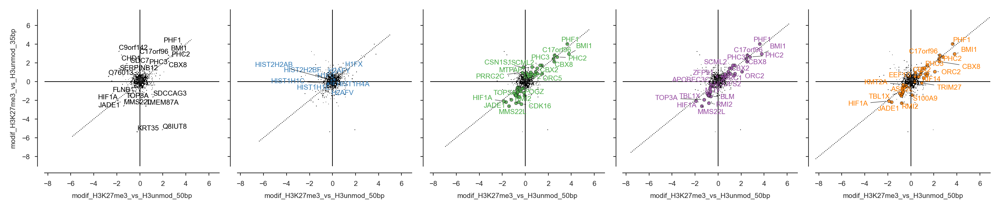

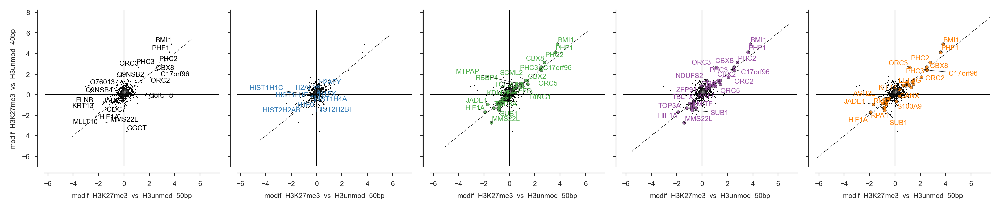

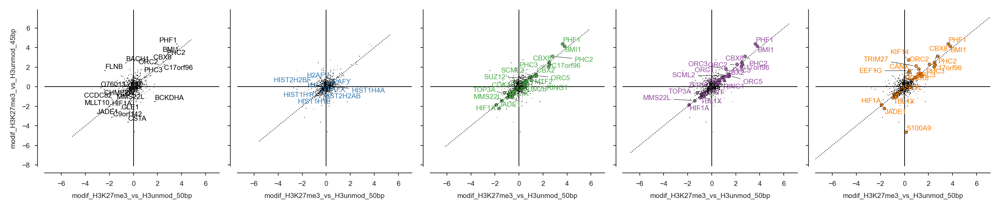

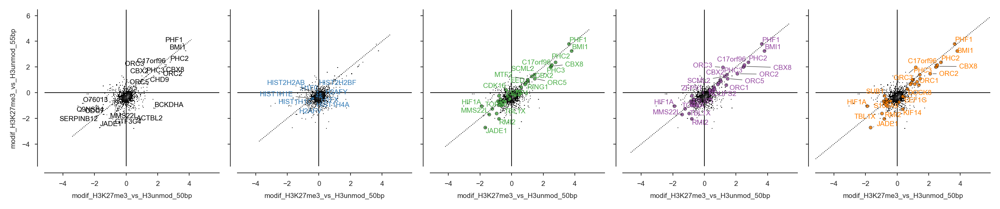

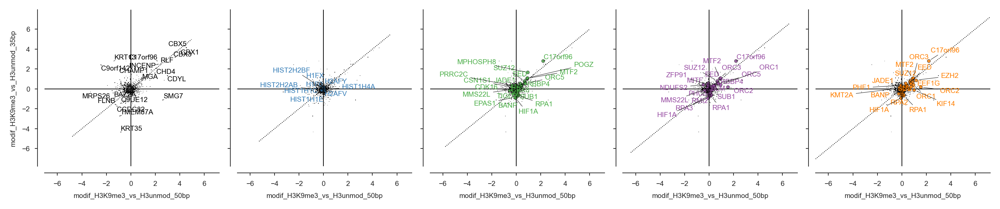

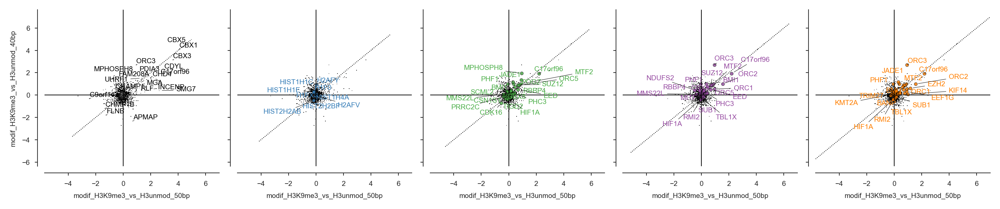

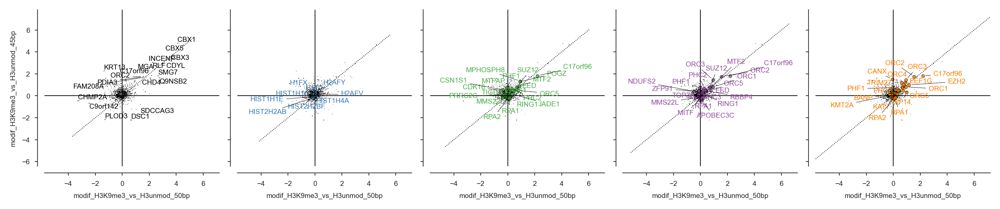

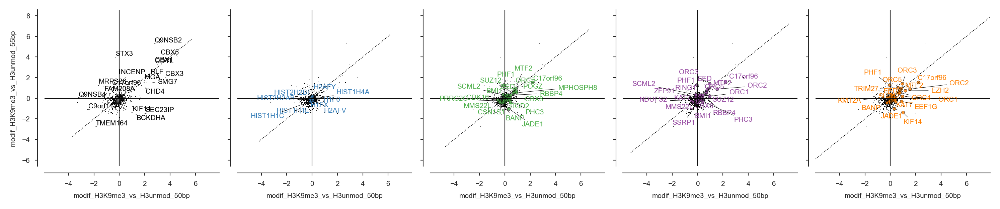

In [133]:
from sklearn.ensemble import IsolationForest
from adjustText import adjust_text
import itertools

if DATASET == 'long-linkers-prom':
    combinations =  [
        ('Promoter_PTMs', '200bp_scr'),
        ('Promoter_PTMs', '200bp_SV40prom')
    ] 
    
elif DATASET == 'long-linkers-enh':
    
    combinations = list(itertools.product(['H3K27ac', 'H3K4me1K27ac', 'H3K4me1'], ['200bp_scr', '200bp_SV40enh']))
else:    
    combinations = list(itertools.product(['H3K27me3', 'H3K9me3'], ['35bp', '40bp', '45bp', '55bp']))


for experiment, linker in combinations:

    fig = plt.figure(figsize=(50*FIVE_MM_IN_INCH, 10*FIVE_MM_IN_INCH), constrained_layout=True)

    axes = fig.subplots(nrows=1, ncols=5, sharex=True, sharey=True)

    _x = (f'modif_{experiment}_vs_{ref_experiment}_{ref_linker}', 'logFC')
    _y = (f'modif_{experiment}_vs_{ref_experiment}_{linker}', 'logFC')
    _df = full_results.dropna(subset=[_x, _y])
    _approx_nlabels = 20

    for ax, col, color in zip(axes, [None] + ['normalisation_proteins'] + list(contrasts_matrix_as_df.columns), sns.color_palette('Set1')):

        sns.histplot(
            x=_x, 
            y=_y, 
            data=_df,
            cmap=sns.blend_palette(['#000000','#969696'], as_cmap=True),
            ax=ax,
        )

        if col is None:
            if_ = IsolationForest(random_state=42, contamination=np.clip(_approx_nlabels/len(_df), 1e-5, 0.5))

            outliers = if_.fit_predict(_df[[_x, _y]])
            outliers = pd.Series((outliers == -1), index=_df.index)

            texts = []
            for ix in outliers[outliers].index:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color='black'))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)
        elif col == 'normalisation_proteins':


            ax.scatter(
                _df.loc[HISTONES, _x],
                _df.loc[HISTONES, _y],
                color=color,
                edgecolor='black',
                alpha=0.8,
                s=5,
                label=col,
            )

            texts = []
            for ix in HISTONES:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color=color))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)

        else:
            subdf = _df[_df[col, 'significant'].fillna(False)]

            if_ = IsolationForest(random_state=42, contamination=np.clip(_approx_nlabels/len(subdf), 1e-5, 0.5))
            outliers = if_.fit_predict(subdf[[_x, _y]])
            outliers = pd.Series((outliers == -1), index=subdf.index)

            ax.scatter(
                subdf[_x],
                subdf[_y],
                color=color,
                edgecolor='black',
                alpha=0.8,
                s=5,
                label=col,
            )

#             ax.legend(title="Significant")

            texts = []
            for ix in outliers[outliers].index:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color=color))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)

        ax.grid(False)

        ax.axvline(0, color='black', linestyle='-', linewidth=0.5)
        ax.axhline(0, color='black', linestyle='-', linewidth=0.5)

        xlim = ax.get_xlim()
        ylim = ax.get_ylim()

        min_ = np.min([xlim, ylim])
        max_ = np.max([xlim, ylim])

        ax.plot([min_, max_], [min_, max_], linestyle=':', color='k')
        ax.set_xlim(*xlim, *ylim)
        ax.set_xlabel('\n'.join(textwrap.wrap(_x[0], 40)))
        ax.set_ylabel('\n'.join(textwrap.wrap(_y[0], 40)))

        sns.despine(offset=5, ax=ax)

    _fname = OUTPUT_DIRECTORY / f'09-scatterplot-full-results_modif_logfc_{experiment}_{linker}.pdf'
    _caption = f"""
    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR {FDR_THRESHOLD}, BH correction).
    Labels are displayed for a handful of outlier proteins.
    """
    plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
    with open(str(_fname) + '.caption.md', 'w') as f:
        f.write(_caption)
        print(_caption)

Linker datasets:

/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/usr/local/Caskroom/miniconda/base/envs/marcs-variable-linker-pds/lib/python3.10/site-packages/sklearn/utils/validation.py:1688: F


    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR 0.05, BH correction).
    Labels are displayed for a handful of outlier proteins.
    


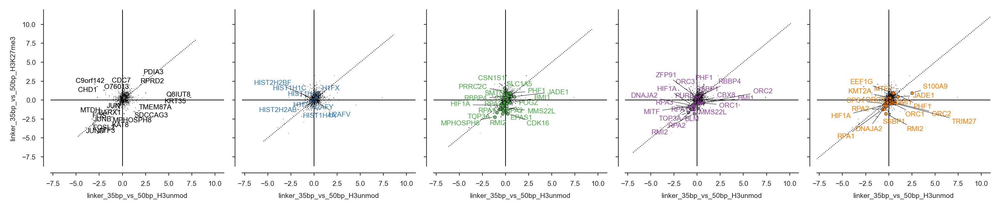

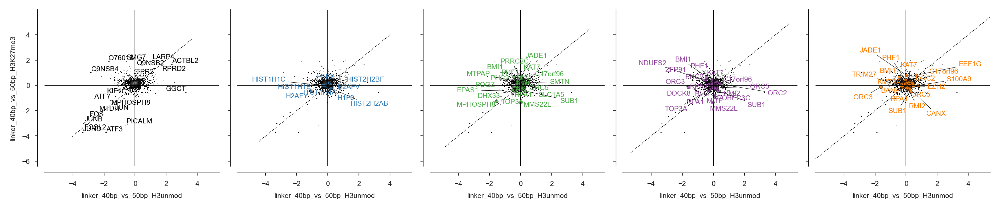

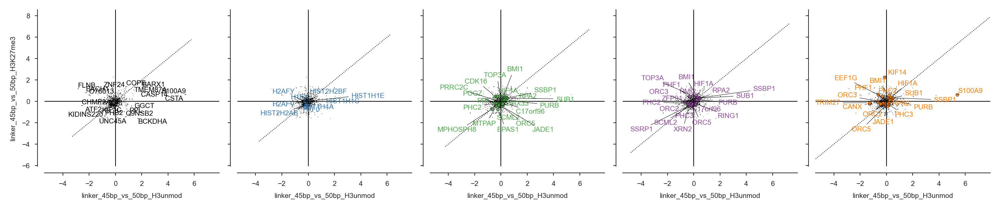

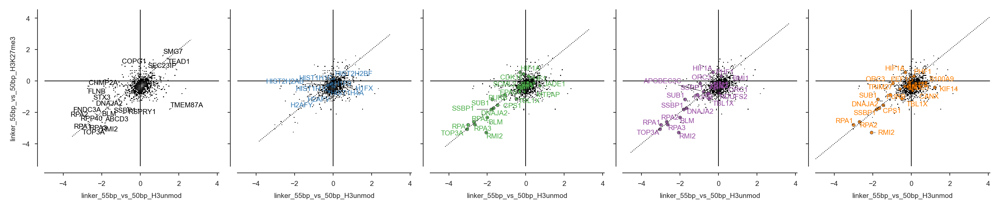

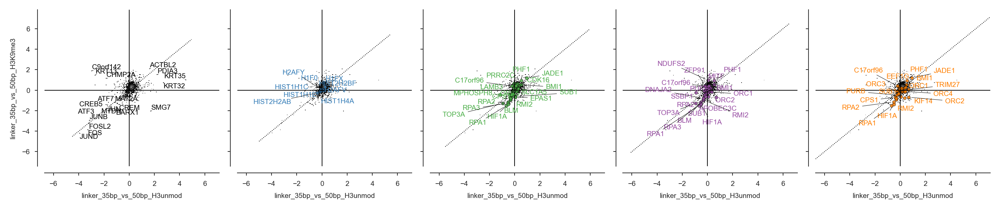

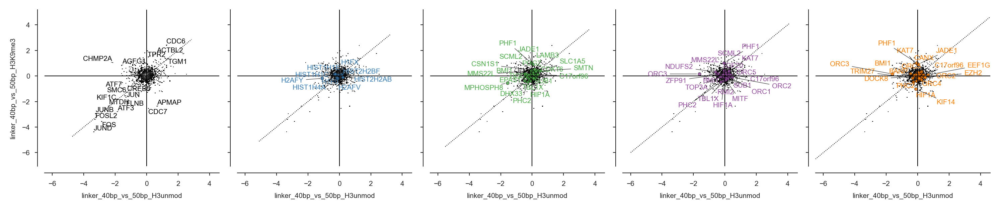

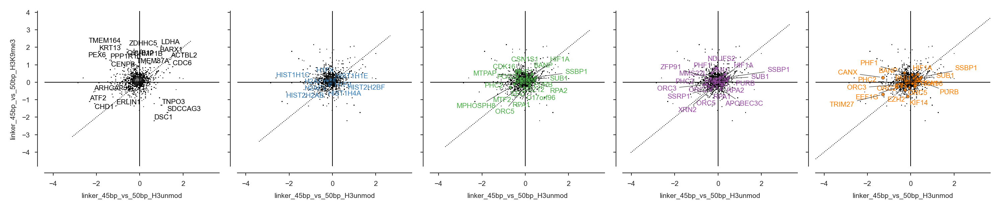

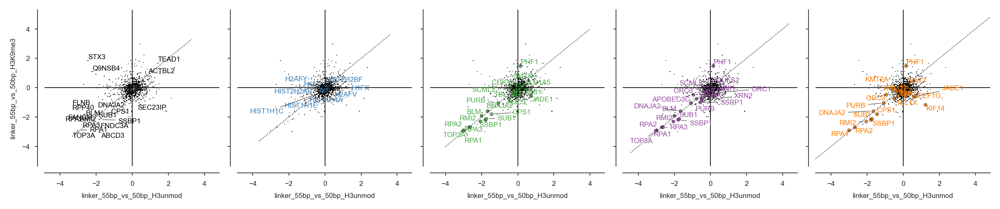

In [ ]:
from sklearn.ensemble import IsolationForest
from adjustText import adjust_text
import itertools

if DATASET == 'long-linkers-prom':
    combinations =  [
        ('Promoter_PTMs', '200bp_scr'),
        ('Promoter_PTMs', '200bp_SV40prom'),
        # ('unmodH3_unmodH4', '200bp_scr'),
        # ('unmodH3_unmodH4', '200bp_SV40prom'),
    ] 
    
elif DATASET == 'long-linkers-enh':
    
    combinations = list(itertools.product(['H3K27ac', 'H3K4me1K27ac', 'H3K4me1'], ['200bp_scr', '200bp_SV40enh']))
else:    
    combinations = list(itertools.product(['H3K27me3', 'H3K9me3'], ['35bp', '40bp', '45bp', '55bp']))


for experiment, linker in combinations:

    fig = plt.figure(figsize=(50*FIVE_MM_IN_INCH, 10*FIVE_MM_IN_INCH), constrained_layout=True)

    axes = fig.subplots(nrows=1, ncols=5, sharex=True, sharey=True)

    _x = (f'linker_{linker}_vs_{ref_linker}_{ref_experiment}', 'logFC')
    _y = (f'linker_{linker}_vs_{ref_linker}_{experiment}', 'logFC')
    _df = full_results.dropna(subset=[_x, _y])
    _approx_nlabels = 20

    for ax, col, color in zip(axes, [None] + ['normalisation_proteins'] + list(contrasts_matrix_as_df.columns), sns.color_palette('Set1')):

        sns.histplot(
            x=_x, 
            y=_y, 
            data=_df,
            cmap=sns.blend_palette(['#000000','#969696'], as_cmap=True),
            ax=ax,
        )

        if col is None:
            if_ = IsolationForest(random_state=42, contamination=np.clip(_approx_nlabels/len(_df), 1e-5, 0.5))

            outliers = if_.fit_predict(_df[[_x, _y]])
            outliers = pd.Series((outliers == -1), index=_df.index)

            texts = []
            for ix in outliers[outliers].index:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color='black'))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)
        elif col == 'normalisation_proteins':


            ax.scatter(
                _df.loc[HISTONES, _x],
                _df.loc[HISTONES, _y],
                color=color,
                edgecolor='black',
                alpha=0.8,
                s=5,
                label=col,
            )

            texts = []
            for ix in HISTONES:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color=color))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)

        else:
            subdf = _df[_df[col, 'significant'].fillna(False)]

            if_ = IsolationForest(random_state=42, contamination=np.clip(_approx_nlabels/len(subdf), 1e-5, 0.5))
            outliers = if_.fit_predict(subdf[[_x, _y]])
            outliers = pd.Series((outliers == -1), index=subdf.index)

            ax.scatter(
                subdf[_x],
                subdf[_y],
                color=color,
                edgecolor='black',
                alpha=0.8,
                s=5,
                label=col,
            )

#             ax.legend(title="Significant")

            texts = []
            for ix in outliers[outliers].index:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color=color))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)

        ax.grid(False)

        ax.axvline(0, color='black', linestyle='-', linewidth=0.5)
        ax.axhline(0, color='black', linestyle='-', linewidth=0.5)

        xlim = ax.get_xlim()
        ylim = ax.get_ylim()

        min_ = np.min([xlim, ylim])
        max_ = np.max([xlim, ylim])

        ax.plot([min_, max_], [min_, max_], linestyle=':', color='k')
        ax.set_xlim(*xlim, *ylim)
        ax.set_xlabel('\n'.join(textwrap.wrap(_x[0], 40)))
        ax.set_ylabel('\n'.join(textwrap.wrap(_y[0], 40)))

        sns.despine(offset=5, ax=ax)

    _fname = OUTPUT_DIRECTORY / f'09-scatterplot-full-results_modif_linker_{experiment}_{linker}.pdf'
    _caption = f"""
    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR {FDR_THRESHOLD}, BH correction).
    Labels are displayed for a handful of outlier proteins.
    """
    plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
    with open(str(_fname) + '.caption.md', 'w') as f:
        f.write(_caption)
        print(_caption)

In [136]:
from sklearn.ensemble import IsolationForest
from adjustText import adjust_text
import itertools

if DATASET == 'long-linkers-prom':
    combinations =  [
        ('Promoter_PTMs', '200bp_SV40prom'),
        ('unmodH3_unmodH4', '200bp_SV40prom'),
    ] 
    
elif DATASET == 'long-linkers-enh':
    combinations =  list(itertools.product(['H3K27ac', 'H3K4me1K27ac', 'H3K4me1', 'H3unmod'], ['200bp_SV40enh']))
    # combinations = list(itertools.product(['H3K27ac', 'H3K4me1K27ac', 'H3K4me1'], ['50bp', '200bp_SV40enh']))
else:
    combinations=[]
    # combinations = list(itertools.product(['H3K27me3', 'H3K9me3'], ['35bp', '40bp', '45bp', '55bp']))


for experiment, linker in combinations:

    fig = plt.figure(figsize=(50*FIVE_MM_IN_INCH, 10*FIVE_MM_IN_INCH), constrained_layout=True)

    axes = fig.subplots(nrows=1, ncols=5, sharex=True, sharey=True)

    _x = (f'linker_{linker}_vs_{ref_linker}_{experiment}', 'logFC')
    _y = (f'linker_{linker}_vs_200bp_scr_{experiment}', 'logFC')
    _df = full_results.dropna(subset=[_x, _y])
    _approx_nlabels = 20

    for ax, col, color in zip(axes, [None] + ['normalisation_proteins'] + list(contrasts_matrix_as_df.columns), sns.color_palette('Set1')):

        sns.histplot(
            x=_x, 
            y=_y, 
            data=_df,
            cmap=sns.blend_palette(['#000000','#969696'], as_cmap=True),
            ax=ax,
        )

        if col is None:
            if_ = IsolationForest(random_state=42, contamination=np.clip(_approx_nlabels/len(_df), 1e-5, 0.5))

            outliers = if_.fit_predict(_df[[_x, _y]])
            outliers = pd.Series((outliers == -1), index=_df.index)

            texts = []
            for ix in outliers[outliers].index:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color='black'))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)
        elif col == 'normalisation_proteins':


            ax.scatter(
                _df.loc[HISTONES, _x],
                _df.loc[HISTONES, _y],
                color=color,
                edgecolor='black',
                alpha=0.8,
                s=5,
                label=col,
            )

            texts = []
            for ix in HISTONES:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color=color))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)

        else:
            subdf = _df[_df[col, 'significant'].fillna(False)]

            if_ = IsolationForest(random_state=42, contamination=np.clip(_approx_nlabels/len(subdf), 1e-5, 0.5))
            outliers = if_.fit_predict(subdf[[_x, _y]])
            outliers = pd.Series((outliers == -1), index=subdf.index)

            ax.scatter(
                subdf[_x],
                subdf[_y],
                color=color,
                edgecolor='black',
                alpha=0.8,
                s=5,
                label=col,
            )

#             ax.legend(title="Significant")

            texts = []
            for ix in outliers[outliers].index:
                texts.append(ax.text(_df.loc[ix, _x], _df.loc[ix, _y], ix, color=color))

            adjust_text(texts, arrowprops=dict(arrowstyle='-'), ax=ax)

        ax.grid(False)

        ax.axvline(0, color='black', linestyle='-', linewidth=0.5)
        ax.axhline(0, color='black', linestyle='-', linewidth=0.5)

        xlim = ax.get_xlim()
        ylim = ax.get_ylim()

        min_ = np.min([xlim, ylim])
        max_ = np.max([xlim, ylim])

        ax.plot([min_, max_], [min_, max_], linestyle=':', color='k')
        ax.set_xlim(*xlim, *ylim)
        ax.set_xlabel('\n'.join(textwrap.wrap(_x[0], 40)))
        ax.set_ylabel('\n'.join(textwrap.wrap(_y[0], 40)))

        sns.despine(offset=5, ax=ax)

    _fname = OUTPUT_DIRECTORY / f'09-scatterplot-full-results_modif_linker_{experiment}_{linker}.pdf'
    _caption = f"""
    A scatterplot diagram of model estimates.

    The first plot simply plots the whole data, the second plot highlights proteins used to normalise the data, while the remaining three plots highlight proteins for which
    the corresponding estimates are statistically non zero. (limma, at FDR {FDR_THRESHOLD}, BH correction).
    Labels are displayed for a handful of outlier proteins.
    """
    plt.savefig(_fname, bbox_inches='tight', dpi=DPI)
    with open(str(_fname) + '.caption.md', 'w') as f:
        f.write(_caption)
        print(_caption)